# **Starmap over time**#

###**Authors:** Moisés Pulido Torres, Lucía Rodríguez Rodríguez, Ángeles Moreno Guedes and Carlos Socas Martín###

---

The aim of our project is to explore the datasets of
astrometric satellites and to visualize the change of the
position of stars as a function of time.

The data:



*   ESA Hipparcos and ESA Gaia mission,
*    brighter than 10th magnitude,
*   and on the nothern hemisphere (Declination>0deg).


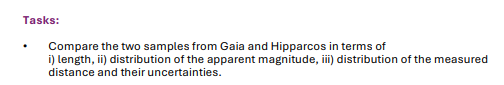


##Important: some cells deppends of other ones, hence try always to execute all cells

In [1]:
!pip install astroquery

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.1/11.1 MB 58.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 28.5 MB/s eta 0:00:00


In [2]:
#gaia query, as discussed in the Técnicas Computacionales Básicas course

import astropy.units as u
from astropy.coordinates.sky_coordinate import SkyCoord
from astropy import coordinates as coord, units as u
from astropy.units import Quantity
from astroquery.gaia import Gaia #to access the Gaia data base
from astroquery.vizier import Vizier #allows us to access the various catalogues (Hipparcos, among them)
import numpy as np
import matplotlib.pyplot as plt

#For reference, here's a notebook that explains queries
#https://colab.research.google.com/github/AllenDowney/AstronomicalData/blob/main/01_query.ipynb#scrollTo=PVThP6mRLgME

#Gaia query
gaia_job = Gaia.launch_job_async("""
SELECT
 source_id, ra, ra_error, dec,
 dec_error, parallax, parallax_error,
 pmra, pmra_error, pmdec, pmdec_error,
 phot_g_mean_mag, phot_bp_mean_mag,
 phot_rp_mean_mag, bp_rp
FROM gaiadr3.gaia_source
WHERE phot_g_mean_mag < 10 AND dec > 0
""", dump_to_file=False)

gaia_data = gaia_job.get_results()

#Hipparcos query

catalogs = Vizier.find_catalogs("Hipparcos")
print(catalogs)

h = Vizier(catalog="I/239") # I/239 is the Hipparcos catalogue identifier
#https://vizier.cds.unistra.fr/viz-bin/VizieR?-source=1239/hip_main


h = Vizier(columns=["HIP", "RAhms", "DEdms", "Vmag", "Plx", "pmRA", "pmDE",
                    "e_RAICRS", "eDEICRS", "e_Plx", "e_pmRA", "e_pmDE",
                    "B-V", "Hpmag", "e_Hpmag"])

hipparcos_data = h.query_constraints(
    catalog="I/239/hip_main",
    Hpmag="<10",
    DEdms=">0"
)

INFO:astroquery:Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
OrderedDict([('I/239', </>)])


In [3]:
#let's take a look at the query results and see each table's length to know how much data (stars) we'll be dealing with

print(gaia_data)
hipparcos_data=hipparcos_data[0]
print(hipparcos_data)

     source_id              ra         ... phot_rp_mean_mag   bp_rp   
                           deg         ...       mag           mag    
------------------- ------------------ ... ---------------- ----------
1576683529448755328 193.50817846782095 ...        2.1307526 0.33836722
1510374147844219904  206.8843267438112 ...        2.3064141 0.16552424
3377166289889430656  95.74037353106223 ...        1.7436333  1.8783841
 418551920284673408  10.12724197930297 ...        1.8435026  1.1434835
 426558460884582016 14.177450998208093 ...        2.3151085 0.41073465
4493746564376875520  263.7341968642716 ...         2.311921  0.6185856
 142853330981747328  46.29487462677558 ...        1.7595884  2.1664658
2067518817314952576 305.55710787667306 ...        2.1739058  0.9935477
1279798794197267072 221.24648617076684 ...        2.1027422  1.1840065
                ...                ... ...              ...        ...
 405264768935233024 15.578805020319432 ...         9.175344  1.5438356
 37594

## Before starting the data analysis, let's first clean out the stars whose data contain NaN values, as this could potentially cause trouble in the calculations later on. To do this, we've defined a mask for each set of data.

In [4]:
#"Cleaning" both data samples of NaN values

nan_mask_g = np.zeros(len(gaia_data), dtype=bool)  #mask which we will fill with booleans

for col in gaia_data.columns:
    if np.issubdtype(gaia_data[col].dtype, np.number): #non-numeric columns are skipped
        nan_mask_g |= np.isnan(gaia_data[col])
        #will assign True to rows which contain NaN in any of their columns

gaia_data_cleaned = gaia_data[~nan_mask_g] #filters NaN values out of the sample

print(f"Rows eliminated due to the presence of NaN in Gaia data: {np.sum(nan_mask_g)}")
#to check how many rows (stars data) have been left out after filtering

nan_mask_h = np.zeros(len(hipparcos_data), dtype=bool)  #mask which we will fill with booleans

for col in hipparcos_data.columns:
    if np.issubdtype(hipparcos_data[col].dtype, np.number):
        nan_mask_h |= np.isnan(hipparcos_data[col])
#np.issubdtype is a function that checks if a type of data is another type of data

hipparcos_data_cleaned = hipparcos_data[~nan_mask_h] #filters NaN values out of the sample

print(f"Rows eliminated due to the presence of NaN in Hipparcos data: {np.sum(nan_mask_h)}")

#we take out negative parallaxes to avoid trouble when computing distances
gaia_data_cleaned = gaia_data_cleaned[gaia_data_cleaned['parallax'] > 0]
hipparcos_data_cleaned = hipparcos_data_cleaned[hipparcos_data_cleaned['Plx'] > 0]


Rows eliminated due to the presence of NaN in Gaia data: 2421
Rows eliminated due to the presence of NaN in Hipparcos data: 1


# Now we are ready to begin the study. First, let's compare the two samples from Gaia and Hipparcos in terms of


*   length
*   distribution of the apparent magnitude
*   distribution of the measured distance and their uncertainties

The results will then be discussed in the report.




In [5]:
#Length comparison
#as we saw earlier, the Gaia data sample is much larger than the Hipparcos one
print(f"Number of stars in the Gaia sample: {len(gaia_data_cleaned)}")
print(f"Number of stars in the Hipparcos sample: {len(hipparcos_data_cleaned)}")

Number of stars in the Gaia sample: 225755
Number of stars in the Hipparcos sample: 49


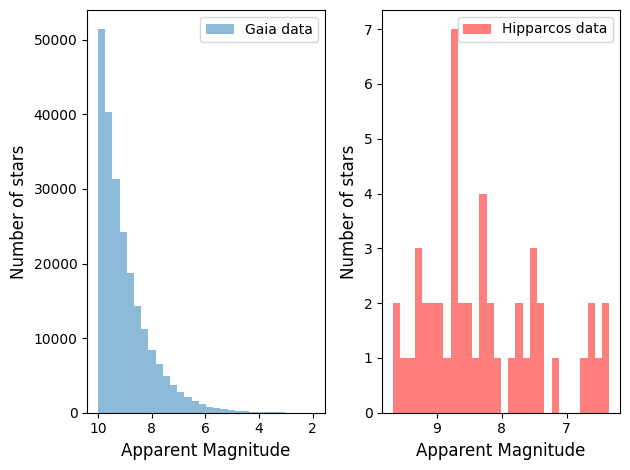

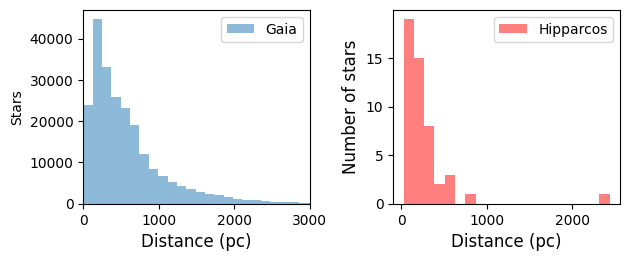

In [6]:
#Apparent magnitude distribution
plt.figure(1)
plt.subplot(121)
plt.hist(gaia_data_cleaned['phot_g_mean_mag'],alpha=0.5, bins=30, label='Gaia data')
plt.xlabel('Apparent Magnitude', fontsize=12)
plt.ylabel('Number of stars', fontsize=12)
plt.gca().invert_xaxis()
plt.legend()
plt.subplot(122)
plt.hist(hipparcos_data_cleaned['Hpmag'], alpha=0.5,bins=30, label='Hipparcos data', color='red')
plt.xlabel('Apparent Magnitude', fontsize=12)
plt.ylabel('Number of stars', fontsize=12)
plt.gca().invert_xaxis()
plt.legend()
plt.tight_layout()


plt.figure(2)

#Distribution of the measured distance and their uncertainties.
#switch to distances and eliminate negative parallaxes


dist_gaia = coord.Distance(parallax=u.Quantity(gaia_data_cleaned['parallax']),
allow_negative=False)

#Error propagation
#\Delta d=d^2\cdot\Delta p

dist_err_gaia = dist_gaia**2*gaia_data_cleaned['parallax_error']/1000

nanMask_gaia = (np.isnan(dist_gaia))
dist_gaia = dist_gaia[~nanMask_gaia]

dist_hipparcos = coord.Distance(parallax=u.Quantity(hipparcos_data_cleaned['Plx']),
allow_negative=False)
dist_err_hipparcos = dist_hipparcos**2*hipparcos_data_cleaned['e_Plx']/1000

nanMask_hipparcos = (np.isnan(dist_hipparcos))
dist_hipparcos = dist_hipparcos[~nanMask_hipparcos]



#Histogram plot

plt.subplot(221)
plt.hist(dist_gaia,alpha=0.5, bins=2000, label='Gaia')
plt.xlabel('Distance (pc)', fontsize=12)
plt.ylabel('Stars')
plt.legend()
plt.xlim(0, 3000)

plt.subplot(222)
plt.hist(dist_hipparcos, alpha=0.5,bins=20, label='Hipparcos', color='red')
plt.xlabel('Distance (pc)', fontsize=12)
plt.ylabel('Number of stars', fontsize=12)
plt.legend()

plt.tight_layout()



/usr/local/lib/python3.11/dist-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:140: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret / rcount


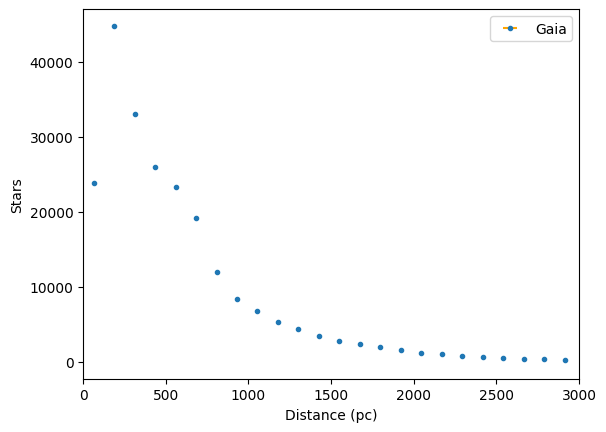

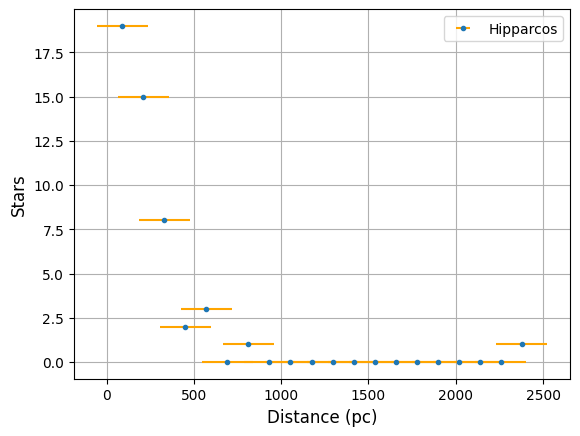

In [7]:
#The error
dist_and_err_gaia=np.array([(dist_gaia),(dist_err_gaia)], dtype=object)


stars, bins = np.histogram(dist_and_err_gaia[0], bins= 2000)
bin_centers = (bins[:-1] + bins[1:]) / 2



#Obtain the errors for each bin
bin_errors = []
for i in range(len(bins) - 1):
  #select the errors of the stars in the current bin
  errors_in_bin = dist_and_err_gaia[1][(dist_and_err_gaia[0] >= bins[i]) & (dist_and_err_gaia[0] < bins[i + 1])]
  #calculate the mean of said errors
  bin_errors = np.mean(errors_in_bin)


bin_errors = np.array(bin_errors)


plt.xlim(0, 3000)
plt.errorbar(bin_centers,stars, xerr=bin_errors, fmt='.', label='Gaia', ecolor='orange')
plt.xlabel('Distance (pc)')
plt.ylabel('Stars')
plt.legend()

plt.figure(2)

dist_and_err_hipparcos=np.array([(dist_hipparcos),(dist_err_hipparcos)], dtype=object)

disthipparcos,stars=np.unique(dist_and_err_hipparcos[0],return_counts=True)

stars, bins = np.histogram(dist_and_err_hipparcos[0], bins= 20)
bin_centers = (bins[:-1] + bins[1:]) / 2




bin_errors = []
for i in range(len(bins) - 1):
  errors_in_bin = dist_and_err_gaia[1][(dist_and_err_gaia[0] >= bins[i]) & (dist_and_err_gaia[0] < bins[i + 1])]
  bin_errors = np.mean(errors_in_bin)


bin_errors = np.array(bin_errors)

bin_errors = np.array(bin_errors)
plt.errorbar(bin_centers,stars, xerr=bin_errors, fmt='.', label='Hipparcos', ecolor='orange')
plt.xlabel('Distance (pc)', fontsize=12)
plt.ylabel('Stars', fontsize=12)
plt.legend()
plt.grid()





     source_id              ra         ... phot_rp_mean_mag   bp_rp  
                           deg         ...       mag           mag   
------------------- ------------------ ... ---------------- ---------
 418551920284673408  10.12724197930297 ...        1.8435026 1.1434835
1279798794197267072 221.24648617076684 ...        2.1027422 1.1840065
 160886283751041408  74.24843702624405 ...        2.0509734 1.4451852
4302054339959905920 296.56498571046956 ...        1.9184874 1.4782449
1222646935698492160 233.67254376294218 ...        2.4125688  0.529583
1563590579347125632 200.98237336533253 ...        2.4338107 0.5343387
 804753180515722624 155.58176101601168 ...        2.0164533  1.645093
4429785739602747392  236.0675744297602 ...        1.9836086 1.3348399
2106630885454013184 283.83388403904866 ...        2.0015056 2.4237096
                ...                ... ...              ...       ...
 405264768935233024 15.578805020319432 ...         9.175344 1.5438356
 375943542596861952 

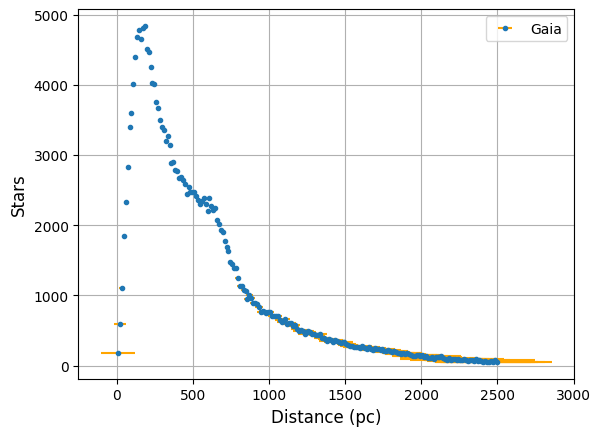

In [8]:
#Here we are going to limit our gaia data in 2500pc like the values in Hipparcos
#Therefore, we are going to do the same procedure as before but with less data in Gaia


gaia_mask=gaia_data_cleaned['parallax']>=0.4
#Here we limit to 25000 before changing the parallax to distance in order to change all the amount of data
gaia_data_cleaned=gaia_data_cleaned[gaia_mask]

print(gaia_data_cleaned)

dist_gaia = coord.Distance(parallax=u.Quantity(gaia_data_cleaned['parallax']),
allow_negative=False)
dist_err_gaia = coord.Distance(parallax=u.Quantity(gaia_data_cleaned['parallax_error']),
allow_negative=False)
nanMask_gaia = (np.isnan(dist_gaia)) | (np.isnan(dist_gaia))
dist_gaia = dist_gaia[~nanMask_gaia]


dist_and_err_gaia=np.array([(dist_gaia),(dist_err_gaia)], dtype=object)

stars, bins = np.histogram(dist_and_err_gaia[0], bins= 200)
bin_centers = (bins[:-1] + bins[1:]) / 2


bin_errors = []
for i in range(len(bins) - 1):
  errors_in_bin = dist_and_err_gaia[1][(dist_and_err_gaia[0] >= bins[i]) & (dist_and_err_gaia[0] < bins[i + 1])]
  if errors_in_bin.size > 0:
    bin_error = np.std(errors_in_bin)/errors_in_bin.size
  else:
    bin_error = 0
  bin_errors.append(bin_error)

bin_errors = np.array(bin_errors)

plt.errorbar(bin_centers,stars, xerr=bin_errors, fmt='.', label='Gaia', ecolor='orange')
plt.xlabel('Distance (pc)', fontsize=12)
plt.ylabel('Stars', fontsize=12)
plt.grid()

plt.legend()

## Now we intend to make sure that no star is duplicated by using input from both catalogues. To do this, we must cross-identify the stars in the samples.

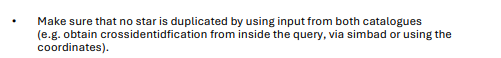

In [9]:
#cross-identification to ensure that no star is duplicated in the queries (by matching stars that appear in both ctalogues)
#https://www.cosmos.esa.int/web/gaia-users/archive/combine-with-other-data
#this tutorial doenst seem to be applicable to our situation


from astropy.coordinates import SkyCoord
from astropy.table import vstack
import astropy.units as u

gaia_coords= SkyCoord(ra=gaia_data_cleaned['ra'].value*u.degree, dec=gaia_data_cleaned['dec'].value*u.degree)
hip_coords= SkyCoord(ra=hipparcos_data_cleaned['RAhms'], dec=hipparcos_data_cleaned['DEdms'], unit=(u.hourangle, u.deg))

#we can use the Skycoord method match_to_catalogue_sky for the cross-matching (https://docs.astropy.org/en/stable/api/astropy.coordinates.SkyCoord.html#astropy.coordinates.SkyCoord.match_to_catalog_sky)
idx, sep2d, dist3d= hip_coords.match_to_catalog_sky(gaia_coords)
#idx: indices into gaia_coords to obtain the matched points for each of the object's coordinates
#sep2d: angle; it's the on-sky separation between the closest match for each element in this object in gaia_coords
#dist3d: The 3D distance between the closest match for each element in this object in catalogcoord. Shape matches this object. Unless both this and catalogcoord have associated distances, this quantity assumes that all sources are at a distance of 1 (dimensionless).

#we can then filter the matches within a small separation threshold (creating and applying a mask)
threshold=1*u.arcsecond #let's set one arcsecond
mask= sep2d>threshold

#we take all of Gaia's data and we'll only add the non-repeated Hipp. stars
unique_gaia_data= gaia_data_cleaned
unique_hipp_data= hipparcos_data_cleaned[mask]

combination=unique_gaia_data.copy() #lets copy it to not accidentally edit the original
#combination.add_rows(unique_hipp_data) #ASTROPY DOESN'T HAVE THE ADD_ROWS METHOD
combination=vstack([unique_gaia_data, unique_hipp_data]) #vertically stacks the tables

#and finally, we show the resulting sample
print(f"Remaining unique stars after cross-matching: {len(combination)}")

#Just for reference, we previously would have had a total of:
print(f"Total number of stars combining Gaia and Hipparcos (without cross-matching): {len(gaia_data_cleaned)+len(hipparcos_data_cleaned)}")

print(f"There were {(len(gaia_data_cleaned)+len(hipparcos_data_cleaned))-len(combination)} duplicated stars")

Remaining unique stars after cross-matching: 222934
Total number of stars combining Gaia and Hipparcos (without cross-matching): 222949
There were 15 duplicated stars


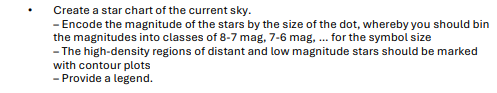

## In order to create a clear star map in which the stars are visible and distinguishable, we have decided to restrict our view of the sky to that of the Canary Islands, from the Teide Observatory.

-13.776408912494972
166.22359108750504
346.22359108750504
166.22359108750504
     source_id              ra         ... phot_rp_mean_mag   bp_rp   
                           deg         ...       mag           mag    
------------------- ------------------ ... ---------------- ----------
1279798794197267072 221.24648617076684 ...        2.1027422  1.1840065
4302054339959905920 296.56498571046956 ...        1.9184874  1.4782449
1222646935698492160 233.67254376294218 ...        2.4125688   0.529583
1563590579347125632 200.98237336533253 ...        2.4338107  0.5343387
4429785739602747392  236.0675744297602 ...        1.9836086  1.3348399
2106630885454013184 283.83388403904866 ...        2.0015056  2.4237096
3704342295607157120 193.89877797423057 ...        2.0112715  1.8989389
4473334474604992384    265.86794661822 ...        2.1105976  1.2892413
1625209684868707328  245.9977069286059 ...        2.2034333  1.0970564
                ...                ... ...              ...        ...


/tmp/ipython-input-4103321973.py:127: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


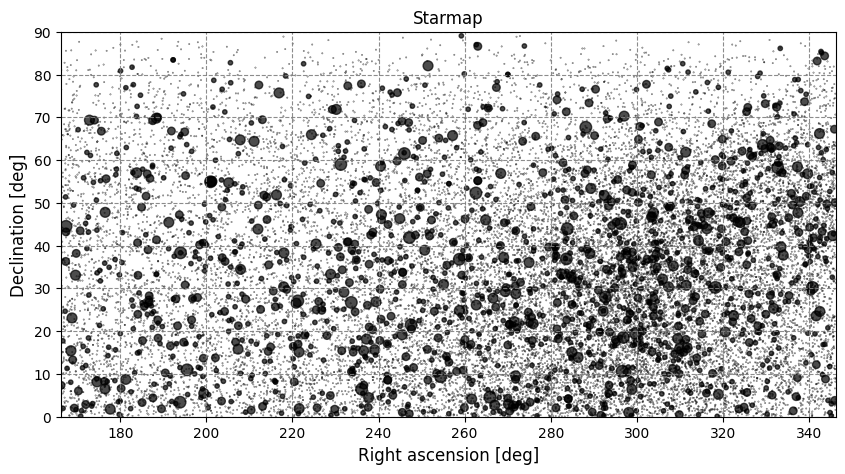

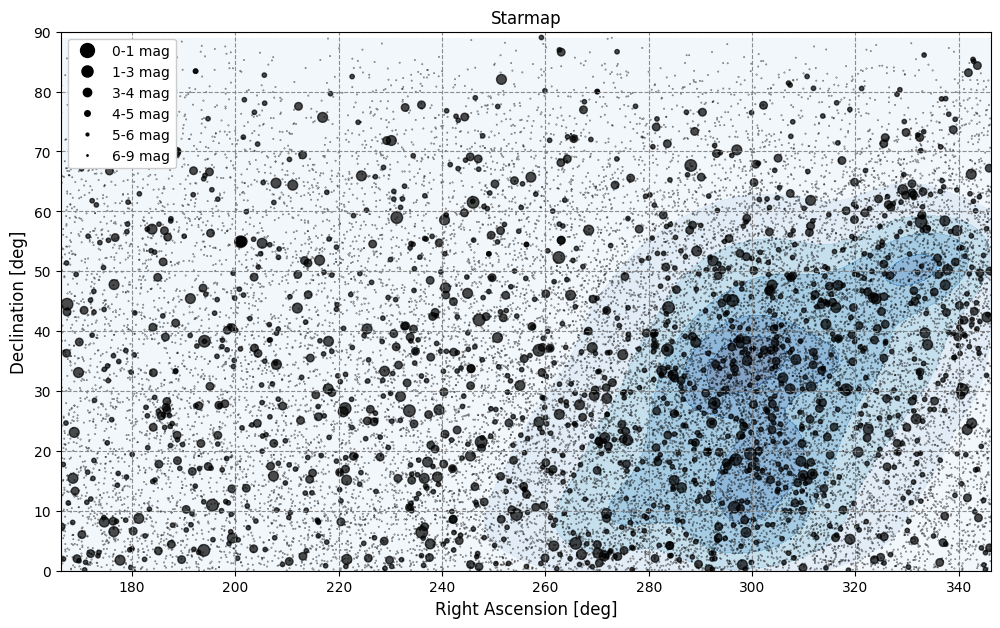

In [10]:
#Restricting the view of the sky to the current one from the Teide Observatory
#Latitude: 28.3º North. Longitude -16.5º
#Lets calculate the RA range

from astropy.time import Time
from astropy.coordinates import EarthLocation
from astropy.time import TimeDelta
from scipy.stats import gaussian_kde
from matplotlib.lines import Line2D

#Observatory location
teide = EarthLocation(lat=28.297, lon=-16.509, height=2390)

#current time, to obtain the current map of the sky
time_now = Time.now()
lst = time_now.sidereal_time('mean', longitude=teide.lon)  #local sidereal time in hours
lst_deg = lst.deg  #conversion to degrees

ra_min = lst_deg - 90
ra_max = lst_deg + 90

print(ra_min)
print(ra_max)

#we correct the range to ensure it stays within [0, 360] using the modulo operator %
ra_min = ra_min % 360
ra_max = ra_max % 360

print(ra_min)
print(ra_max)


if ra_min < ra_max:
    mask = (gaia_data_cleaned['ra'] >= ra_min) & (gaia_data_cleaned['ra'] <= ra_max)
else:
    mask = (gaia_data_cleaned['ra'] <= ra_min) & (gaia_data_cleaned['ra'] >= ra_max)


#subset of Gaia data that only includes stars visible from Teide
gaia_data_cleanedTnf = gaia_data_cleaned[mask]



print(gaia_data_cleanedTnf)

#magnitude filtering

#first we check the range of magnitude values in our data
print(np.max(gaia_data_cleanedTnf['phot_g_mean_mag']))
print(np.min(gaia_data_cleanedTnf['phot_g_mean_mag']))

#then we take stars that are brighter than 8.5 (apparent magnitude)

maskTnf=gaia_data_cleanedTnf['phot_g_mean_mag']<=8.5
gaia_data_cleanedTnf8=gaia_data_cleanedTnf[maskTnf]

mag8Tnf=gaia_data_cleanedTnf8['phot_g_mean_mag'] #abbreviation of the name

print(gaia_data_cleanedTnf8)

#we define a function to assign sizes (in the plot) to magnitude values. Brighter stars will be shown as larger dots than dimmer stars.
def mag_size(M_g):
  mag_sizes=[100,70,50,30,10,0.1]
  if M_g<=1:
    return mag_sizes[0]
  elif M_g<=3:
    return mag_sizes[1]
  elif M_g<=4:
    return mag_sizes[2]
  elif M_g<=5:
    return mag_sizes[3]
  elif M_g<=6:
    return mag_sizes[4]
  else:
    return mag_sizes[5]

star_sizes=[mag_size(mag) for mag in mag8Tnf]


plt.figure(figsize=(10, 5))
plt.scatter(gaia_data_cleanedTnf8['ra'], gaia_data_cleanedTnf8['dec'], s=star_sizes, c="black" ,alpha=0.7,edgecolors='black')
plt.title("Starmap")
plt.grid(color='gray', linestyle='--', linewidth=0.8, alpha=0.9)
plt.xlim(ra_max,ra_min)
plt.ylim(0,90)
plt.xlabel("Right ascension [deg]", fontsize=12)
plt.ylabel("Declination [deg]", fontsize=12)
legend_elements=[
    Line2D([0], [0], marker='o', color='black', label='0-1 mag', markersize=10, markerfacecolor='black', linestyle='None'),
    Line2D([0], [0], marker='o', color='black', label='1-3 mag', markersize=8, markerfacecolor='black', linestyle='None'),
    Line2D([0], [0], marker='o', color='black', label='3-4 mag', markersize=6, markerfacecolor='black', linestyle='None'),
    Line2D([0], [0], marker='o', color='black', label='4-5 mag', markersize=4, markerfacecolor='black', linestyle='None'),
    Line2D([0], [0], marker='o', color='black', label='5-6 mag', markersize=2, markerfacecolor='black', linestyle='None'),
    Line2D([0], [0], marker='o', color='black', label='6-9 mag', markersize=2, markerfacecolor='black', linestyle='None'),
]


#we also wish to include density contour plots in our map for high density regions of distant and low magnitude stars


dist_Tnf = coord.Distance(parallax=u.Quantity(gaia_data_cleanedTnf['parallax']),allow_negative=False)


nanMask_gaia = (np.isnan(dist_Tnf))
dist_Tnf = dist_Tnf[~nanMask_gaia]

print(np.mean(dist_Tnf))
print(np.mean(gaia_data_cleanedTnf['phot_g_mean_mag']))

#lets consider as 'distant and low magnitude' those stars farther than 1000 pc and with apparent magnitude of 8.5 as the minimum value

maskTnf=(dist_Tnf>=1000*u.pc) & (gaia_data_cleanedTnf['phot_g_mean_mag']>=8.5)
gaia_data_cleanedTnf_lejos=gaia_data_cleanedTnf[maskTnf] #'lejos' means 'far' in spanish... sorry for the accidental spanglish
print(gaia_data_cleanedTnf_lejos)


#we create a grid of RA and Dec values
ra_grid, dec_grid = np.meshgrid(np.linspace(gaia_data_cleanedTnf_lejos['ra'].min(), gaia_data_cleanedTnf_lejos['ra'].max(), 100),
                                 np.linspace(gaia_data_cleanedTnf_lejos['dec'].min(), gaia_data_cleanedTnf_lejos['dec'].max(), 100))

#and evaluate the density on the grid
kde = gaussian_kde(np.vstack([gaia_data_cleanedTnf_lejos['ra'], gaia_data_cleanedTnf_lejos['dec']]))
positions = np.vstack([ra_grid.ravel(), dec_grid.ravel()])
density_grid = kde(positions).reshape(ra_grid.shape)

plt.figure(figsize=(12, 7))
contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)
plt.scatter(gaia_data_cleanedTnf8['ra'], gaia_data_cleanedTnf8['dec'], s=star_sizes, c="black" ,alpha=0.7,edgecolors='black')
plt.title("Starmap")
plt.grid(color='gray', linestyle='--', linewidth=0.8, alpha=0.9)
plt.xlim(ra_max,ra_min)
plt.ylim(0,90)
plt.xlabel("Right Ascension [deg]", fontsize=12)
plt.ylabel("Declination [deg]", fontsize=12)
legend_elements=[
    Line2D([0], [0], marker='o', color='black', label='0-1 mag', markersize=10, markerfacecolor='black', linestyle='None'),
    Line2D([0], [0], marker='o', color='black', label='1-3 mag', markersize=8, markerfacecolor='black', linestyle='None'),
    Line2D([0], [0], marker='o', color='black', label='3-4 mag', markersize=6, markerfacecolor='black', linestyle='None'),
    Line2D([0], [0], marker='o', color='black', label='4-5 mag', markersize=4, markerfacecolor='black', linestyle='None'),
    Line2D([0], [0], marker='o', color='black', label='5-6 mag', markersize=2, markerfacecolor='black', linestyle='None'),
    Line2D([0], [0], marker='.', color='black', label='6-9 mag', markersize=2, markerfacecolor='black', linestyle='None'),
]

plt.legend(handles=legend_elements, loc='upper left', fontsize=10, framealpha=1)


## Now highlighting the constellations

560.3825971399427 pc
9.011586583121941
     source_id              ra         ... phot_rp_mean_mag   bp_rp   
                           deg         ...       mag           mag    
------------------- ------------------ ... ---------------- ----------
1856326238763114752 311.53595178604144 ...         7.377842  2.4255648
4301042514382306688  294.9178055105452 ...         8.340298   0.217947
1794736064130354816  329.6238721609432 ...        7.2343116  3.0005746
2078435627752870272 297.81259801437363 ...        7.4129825   2.326651
4289673078801007360 292.61394008657857 ...         7.860555  1.1112065
2241110984415742336  298.3140239870638 ...         7.346047  2.5242248
4301429679916867968  295.6577114403907 ...        8.4255495 0.09054184
2020525552921287040  296.3026354773561 ...        7.8724165  1.0676365
2191341796747276160 318.33080268437897 ...        7.7564945  1.3352976
                ...                ... ...              ...        ...
4301295298988827520 294.11502289565925

/tmp/ipython-input-3534761602.py:80: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7,alpha=0.5)


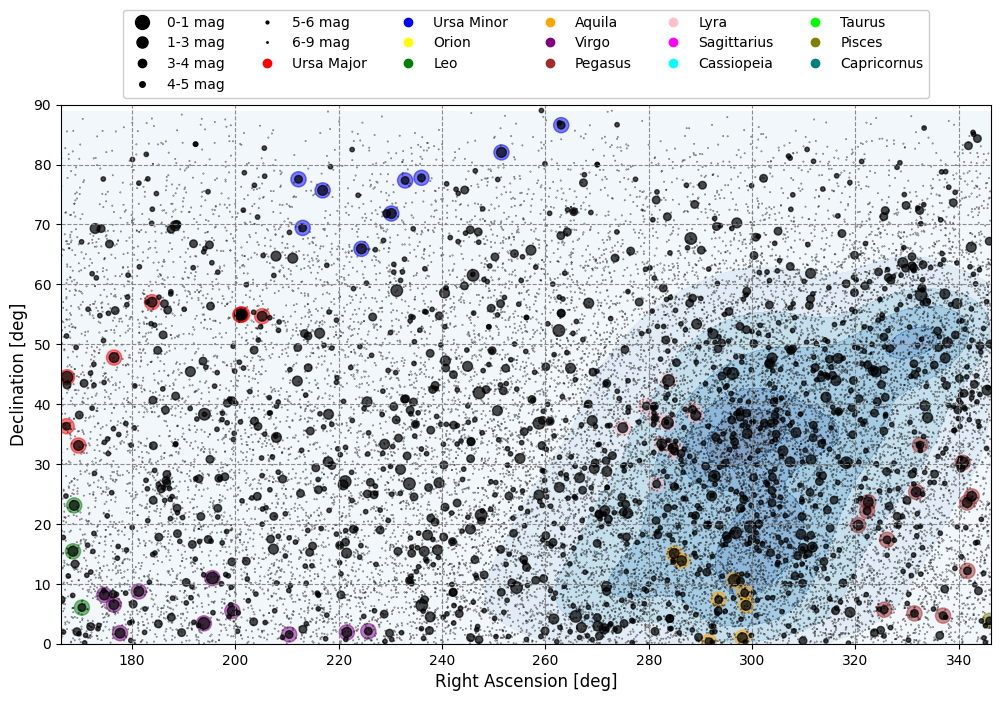

In [11]:
#Lets first create lists with the information about different constellations

ra_constelacion = []
dec_constelacion = []
star_colors = []

def constellation_color(star):
    constelaciones = ['Ursa Major', 'Ursa Minor', 'Orion', 'Leo', 'Aquila', 'Virgo', 'Pegasus', 'Lyra', 'Sagittarius', 'Cassiopeia', 'Taurus', 'Pisces', 'Capricornus']
    ra = star['ra']
    dec = star['dec']
    coord = SkyCoord(ra=ra * u.degree, dec=dec * u.degree, frame='icrs')
    constellation = coord.get_constellation()
    if constellation in constelaciones:
        ra_constelacion.append(ra)
        dec_constelacion.append(dec)
        if constellation == 'Ursa Major':
            return 'red'
        elif constellation == 'Ursa Minor':
            return 'blue'
        elif constellation == 'Orion':
            return 'yellow'
        elif constellation == 'Leo':
            return 'green'
        elif constellation == 'Aquila':
            return 'orange'
        elif constellation == 'Virgo':
            return 'purple'
        elif constellation == 'Pegasus':
            return 'brown'
        elif constellation == 'Lyra':
            return 'pink'
        elif constellation == 'Sagittarius':
            return 'magenta'
        elif constellation == 'Cassiopeia':
            return 'cyan'
        elif constellation == 'Taurus':
            return 'lime'
        elif constellation == 'Pisces':
            return 'olive'
        elif constellation == 'Capricornus':
            return 'teal'
    return None


maskTnf=gaia_data_cleanedTnf['phot_g_mean_mag']<=4.5
gaia_data_cleanedTnf4=gaia_data_cleanedTnf[maskTnf] #magnitude restriction we will use for the constellations


#filter out None values (stars not in the constellation list)
star_colors = [c for c in [constellation_color(star) for star in gaia_data_cleanedTnf4] if c is not None]



dist_Tnf = coord.Distance(parallax=u.Quantity(gaia_data_cleanedTnf['parallax']),
allow_negative=False)

nanMask_gaia = (np.isnan(dist_Tnf))
dist_Tnf = dist_Tnf[~nanMask_gaia]

print(np.mean(dist_Tnf))
print(np.mean(gaia_data_cleanedTnf['phot_g_mean_mag']))

#Once again lets consider as 'distant and low magnitude' those stars farther than 1000 pc and with apparent magnitude of 8.5 as the minimum value

maskTnf=(dist_Tnf>=1000*u.pc) & (gaia_data_cleanedTnf['phot_g_mean_mag']>=8.5)
gaia_data_cleanedTnf_lejos=gaia_data_cleanedTnf[maskTnf]
print(gaia_data_cleanedTnf_lejos)


#Create a grid of RA and Dec values
ra_grid, dec_grid = np.meshgrid(np.linspace(gaia_data_cleanedTnf_lejos['ra'].min(), gaia_data_cleanedTnf_lejos['ra'].max(), 100),
                                 np.linspace(gaia_data_cleanedTnf_lejos['dec'].min(), gaia_data_cleanedTnf_lejos['dec'].max(), 100))

#We evaluate the density on the grid
kde = gaussian_kde(np.vstack([gaia_data_cleanedTnf_lejos['ra'], gaia_data_cleanedTnf_lejos['dec']]))
positions = np.vstack([ra_grid.ravel(), dec_grid.ravel()])
density_grid = kde(positions).reshape(ra_grid.shape)

plt.figure(figsize=(12, 7))
contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7,alpha=0.5)
plt.scatter(ra_constelacion, dec_constelacion, s=120, c=star_colors ,alpha=0.5)
plt.scatter(gaia_data_cleanedTnf8['ra'], gaia_data_cleanedTnf8['dec'], s=star_sizes, c="black" ,alpha=0.7,edgecolors='black')
plt.grid(color='gray', linestyle='--', linewidth=0.8, alpha=0.9)
plt.xlim(np.min(gaia_data_cleanedTnf['ra']),np.max(gaia_data_cleanedTnf['ra']))
plt.ylim(0,90)
plt.xlabel("Right Ascension [deg]", fontsize=12)
plt.ylabel("Declination [deg]", fontsize=12)
legend_elements=[
    Line2D([0], [0], marker='o', color='black', label='0-1 mag', markersize=10, markerfacecolor='black', linestyle='None'),
    Line2D([0], [0], marker='o', color='black', label='1-3 mag', markersize=8, markerfacecolor='black', linestyle='None'),
    Line2D([0], [0], marker='o', color='black', label='3-4 mag', markersize=6, markerfacecolor='black', linestyle='None'),
    Line2D([0], [0], marker='o', color='black', label='4-5 mag', markersize=4, markerfacecolor='black', linestyle='None'),
    Line2D([0], [0], marker='o', color='black', label='5-6 mag', markersize=2, markerfacecolor='black', linestyle='None'),
    Line2D([0], [0], marker='.', color='black', label='6-9 mag', markersize=2, markerfacecolor='black', linestyle='None'),
    Line2D([0], [0], marker='o', color='red', label='Ursa Major', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='blue', label='Ursa Minor', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='yellow', label='Orion', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='green', label='Leo', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='orange', label='Aquila', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='purple', label='Virgo', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='brown', label='Pegasus', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='pink', label='Lyra', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='magenta', label='Sagittarius', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='cyan', label='Cassiopeia', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='lime', label='Taurus', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='olive', label='Pisces', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='teal', label='Capricornus', markersize=6, linestyle='None'),
]

plt.legend(handles=legend_elements, loc='lower center', fontsize=10, framealpha=1, bbox_to_anchor=(0.5,1), ncol=6)





## We have plotted dim stars as very small grey dots in the background of our star map to ensure they don't impede the clear vision of brighter stars. Now that we have observed the full star distribution, moving forward in the analysis we will only represent the 'dots' of brighter stars as to not fill the graph with excessive or overwhelming information.

     source_id              ra         ... phot_rp_mean_mag    bp_rp    
                           deg         ...       mag            mag     
------------------- ------------------ ... ---------------- ------------
1868589263745679488 318.36010345780056 ...         5.765171   0.37307644
2218438436177932032  330.0140462755215 ...        4.9658895     2.254609
2005264640764436736  331.8565776535759 ...        5.5955043    0.6785898
2058352669922023424  301.9226714658501 ...         5.897586   0.26390553
4468233187335913472 271.15566156881096 ...         6.087781 -0.027383327
2180724328359582720 308.70999730743256 ...        5.7502823   0.52657175
1827820678254631040 297.04932877633166 ...        5.0765233    2.2277102
1821596755283891840  298.0906860652613 ...        6.1338778   0.03799486
2163751614044043136 314.49767285306865 ...        4.8606753     3.520474
                ...                ... ...              ...          ...
4301295298988827520 294.11502289565925 ...         

/tmp/ipython-input-1493452663.py:87: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


<Figure size 640x480 with 0 Axes>

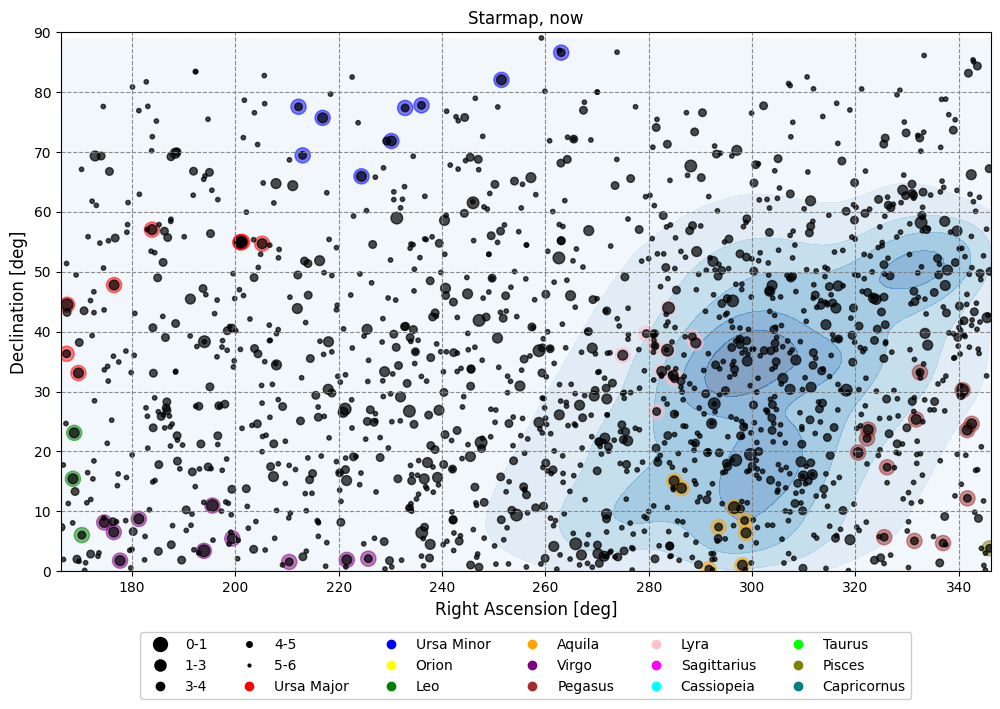

In [12]:
#Before doing anything else, lets take another look at the map we just plotted, this time only with stars brighter than 6 (apparent magnitude)
#Some parts are the same as previous cells and can be redundant, but we are taking different cases and the time in Tnf, therefore the results can change in time and if we execute only one cell and
#we don't repeat the reduction of, for example, magnitudes brighter than 6, the longitude or the mask could change since the range of ra taken is changing
#However, they are repeating because we are representing different ways to make starmaps. If we conclude in one way this kind of operation will only appear once

maskTnf=gaia_data_cleanedTnf['phot_g_mean_mag']<=6
gaia_data_cleanedTnf6=gaia_data_cleanedTnf[maskTnf]

mag6Tnf=gaia_data_cleanedTnf6['phot_g_mean_mag']

star_sizes=[mag_size(mag) for mag in mag6Tnf]


maskTnf=(dist_Tnf>=1000*u.pc) & (gaia_data_cleanedTnf['phot_g_mean_mag']>=6)
gaia_data_cleanedTnf_lejos=gaia_data_cleanedTnf[maskTnf]
print(gaia_data_cleanedTnf_lejos)



# Create a grid of RA and Dec values
ra_grid, dec_grid = np.meshgrid(np.linspace(gaia_data_cleanedTnf_lejos['ra'].min(), gaia_data_cleanedTnf_lejos['ra'].max(), 100),
                                 np.linspace(gaia_data_cleanedTnf_lejos['dec'].min(), gaia_data_cleanedTnf_lejos['dec'].max(), 100))

# Evaluate the density on the grid
kde = gaussian_kde(np.vstack([gaia_data_cleanedTnf_lejos['ra'], gaia_data_cleanedTnf_lejos['dec']]))
positions = np.vstack([ra_grid.ravel(), dec_grid.ravel()])
density_grid = kde(positions).reshape(ra_grid.shape)

#lists to store the data obtained in the function constellation_color
ra_constelacion = []
dec_constelacion = []
star_colors = []

def constellation_color(star):
    constelaciones = ['Ursa Major', 'Ursa Minor', 'Orion', 'Leo', 'Aquila', 'Virgo', 'Pegasus', 'Lyra', 'Sagittarius', 'Cassiopeia', 'Taurus', 'Pisces', 'Capricornus']
    ra = star['ra']
    dec = star['dec']
    coord = SkyCoord(ra=ra * u.degree, dec=dec * u.degree, frame='icrs') #extracts the star's coordinates
    constellation = coord.get_constellation()
    #https://docs.astropy.org/en/stable/api/astropy.coordinates.get_constellation.html Determines the constellation(s) a given coordinate object contains.
    if constellation in constelaciones:
        ra_constelacion.append(ra) #if the constellation is in our constelaciones list, we assign a colour to it
        dec_constelacion.append(dec)
        if constellation == 'Ursa Major':
            return 'red'
        elif constellation == 'Ursa Minor':
            return 'blue'
        elif constellation == 'Orion':
            return 'yellow'
        elif constellation == 'Leo':
            return 'green'
        elif constellation == 'Aquila':
            return 'orange'
        elif constellation == 'Virgo':
            return 'purple'
        elif constellation == 'Pegasus':
            return 'brown'
        elif constellation == 'Lyra':
            return 'pink'
        elif constellation == 'Sagittarius':
            return 'magenta'
        elif constellation == 'Cassiopeia':
            return 'cyan'
        elif constellation == 'Taurus':
            return 'lime'
        elif constellation == 'Pisces':
            return 'olive'
        elif constellation == 'Capricornus':
            return 'teal'
    return None


maskTnf=gaia_data_cleanedTnf['phot_g_mean_mag']<=4.5
gaia_data_cleanedTnf4=gaia_data_cleanedTnf[maskTnf]


#filter out None values (stars not in the constellation list)
star_colors = [c for c in [constellation_color(star) for star in gaia_data_cleanedTnf4] if c is not None]




#plot the contour using the density grid
plt.figure(1)

plt.figure(figsize=(12, 7))
contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)
plt.scatter(ra_constelacion, dec_constelacion, s=120, c=star_colors ,alpha=0.5)
plt.scatter(gaia_data_cleanedTnf6['ra'], gaia_data_cleanedTnf6['dec'], s=star_sizes, c="black" ,alpha=0.7,edgecolors='black')
plt.title("Starmap, now")
plt.grid(color='gray', linestyle='--', linewidth=0.8, alpha=0.9)
plt.xlim(np.min(gaia_data_cleanedTnf['ra']),np.max(gaia_data_cleanedTnf['ra']))
plt.ylim(0,90)
plt.xlabel("Right Ascension [deg]", fontsize=12)
plt.ylabel("Declination [deg]", fontsize=12)
legend_elements=[
    Line2D([0], [0], marker='o', color='black', label='0-1', markersize=10, markerfacecolor='black', linestyle='None'),
    Line2D([0], [0], marker='o', color='black', label='1-3', markersize=8, markerfacecolor='black', linestyle='None'),
    Line2D([0], [0], marker='o', color='black', label='3-4', markersize=6, markerfacecolor='black', linestyle='None'),
    Line2D([0], [0], marker='o', color='black', label='4-5', markersize=4, markerfacecolor='black', linestyle='None'),
    Line2D([0], [0], marker='o', color='black', label='5-6 ', markersize=2, markerfacecolor='black', linestyle='None'),
    Line2D([0], [0], marker='o', color='red', label='Ursa Major', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='blue', label='Ursa Minor', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='yellow', label='Orion', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='green', label='Leo', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='orange', label='Aquila', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='purple', label='Virgo', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='brown', label='Pegasus', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='pink', label='Lyra', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='magenta', label='Sagittarius', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='cyan', label='Cassiopeia', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='lime', label='Taurus', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='olive', label='Pisces', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='o', color='teal', label='Capricornus', markersize=6, linestyle='None'),
]

plt.legend(handles=legend_elements, loc='lower center', fontsize=10, framealpha=1, bbox_to_anchor=(0.5,-0.25), ncol=6)


## Now let's create a sequence of star charts to see their evolution with time. We are asked to take into account proper motions of the stars over 200.000 years to simulate their movement, producing maps like the one we already have for each step taken.

1


/tmp/ipython-input-3966763253.py:88: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


2


/tmp/ipython-input-3966763253.py:88: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


3


/tmp/ipython-input-3966763253.py:88: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


4


/tmp/ipython-input-3966763253.py:88: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


5


/tmp/ipython-input-3966763253.py:88: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


6


/tmp/ipython-input-3966763253.py:88: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


7


/tmp/ipython-input-3966763253.py:88: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


8


/tmp/ipython-input-3966763253.py:88: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


9


/tmp/ipython-input-3966763253.py:88: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


10


/tmp/ipython-input-3966763253.py:88: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


<Figure size 640x480 with 0 Axes>

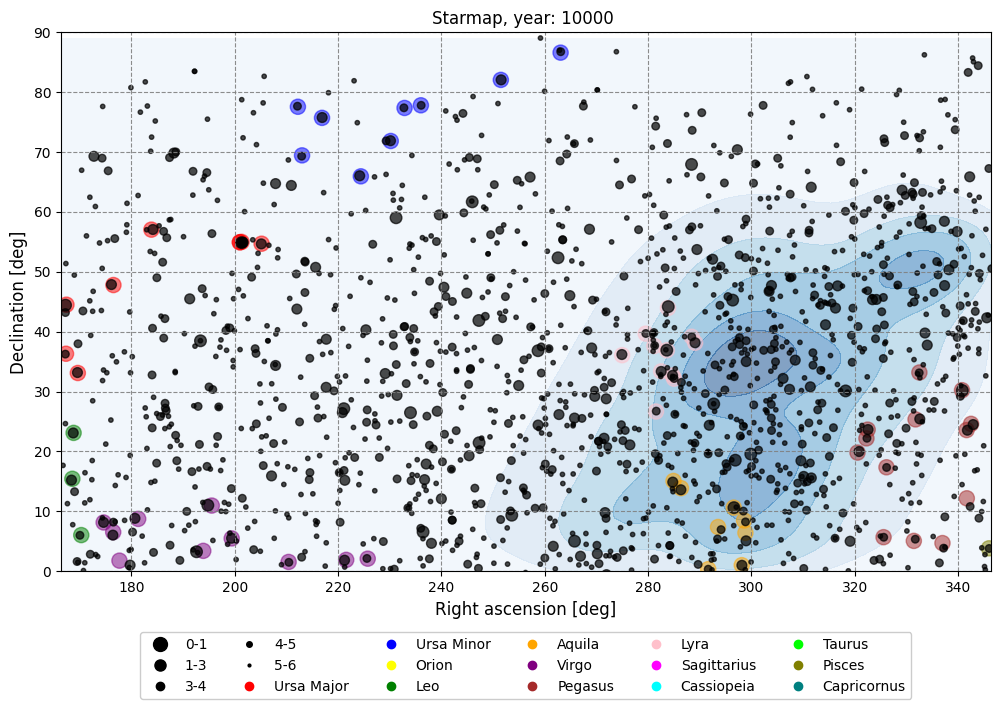

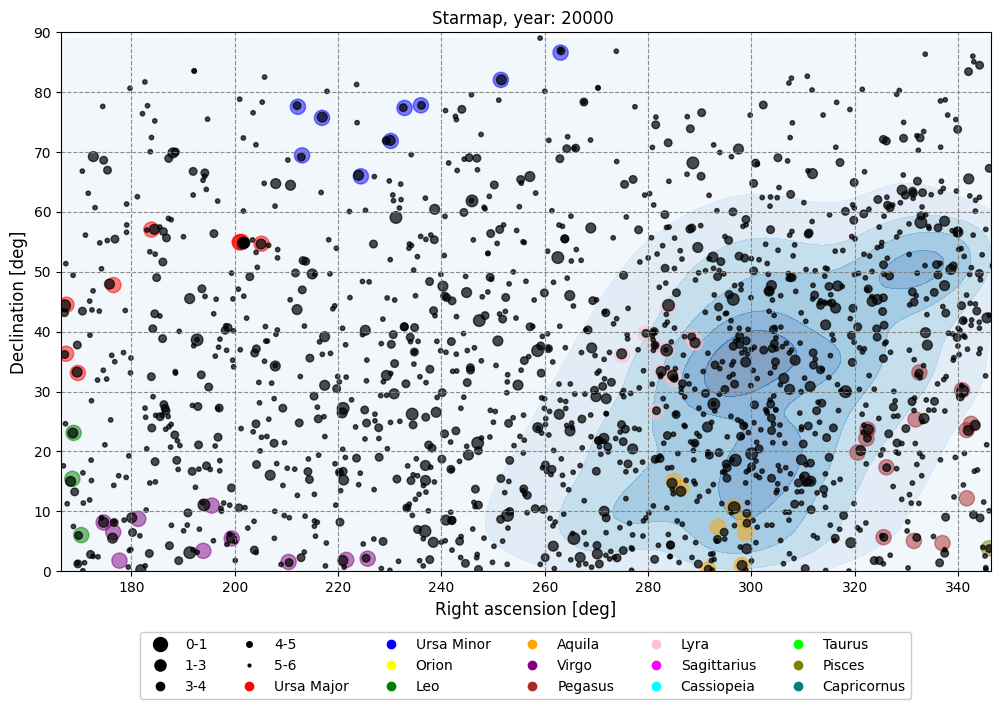

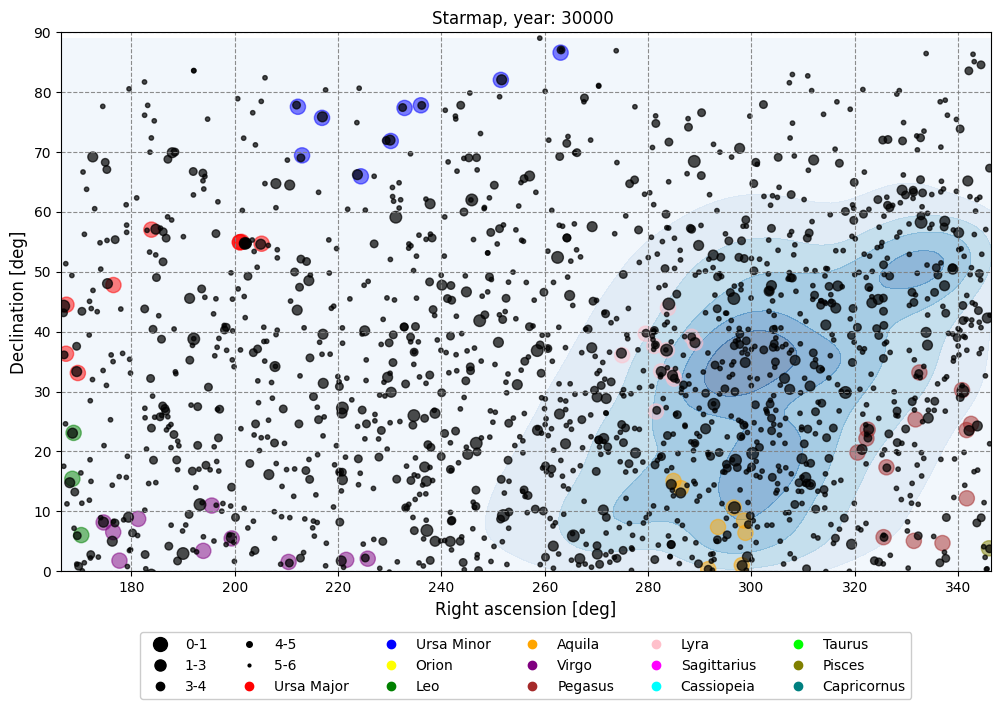

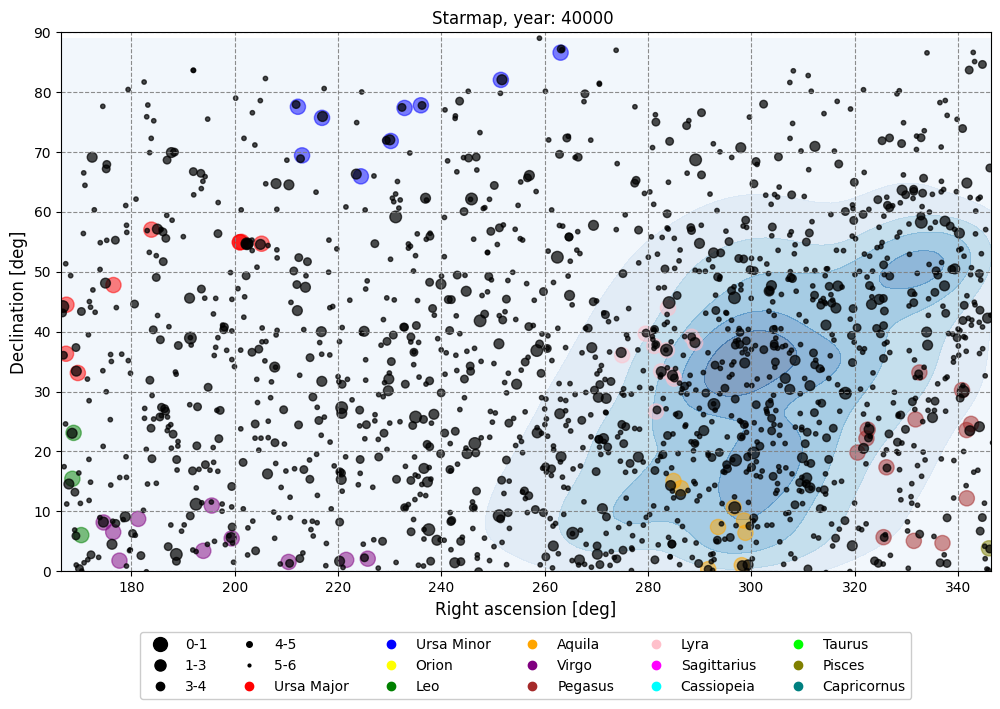

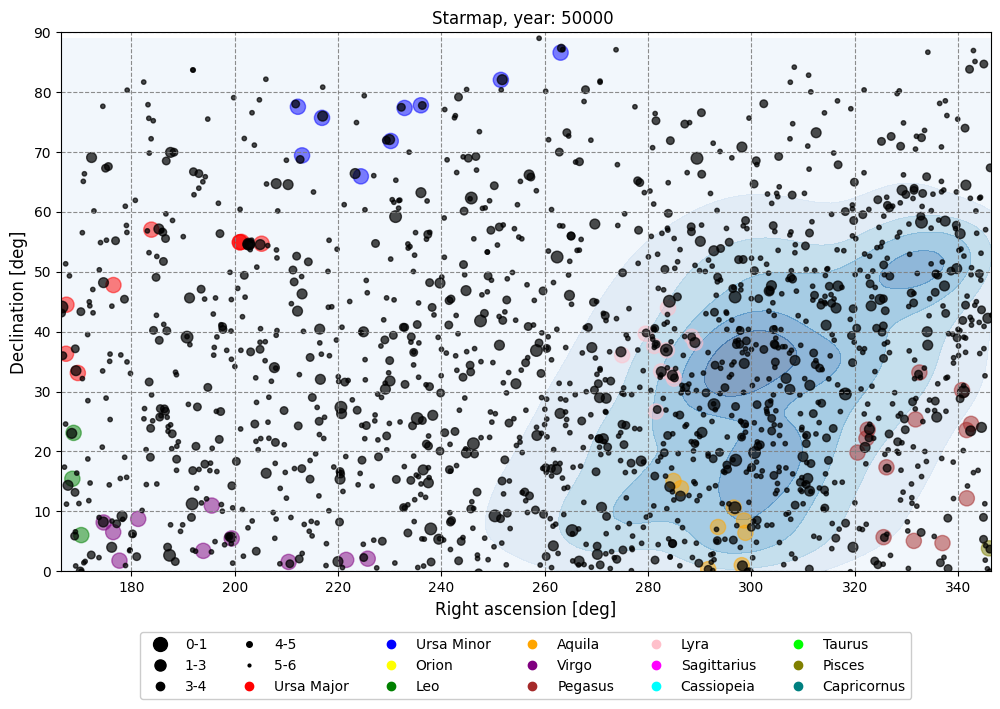

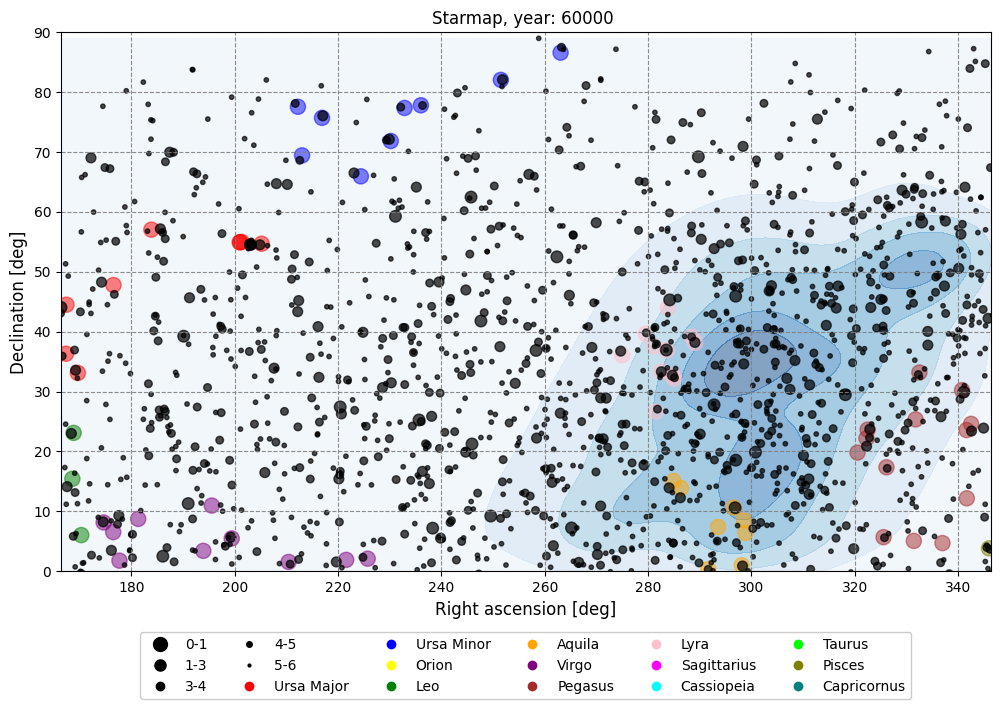

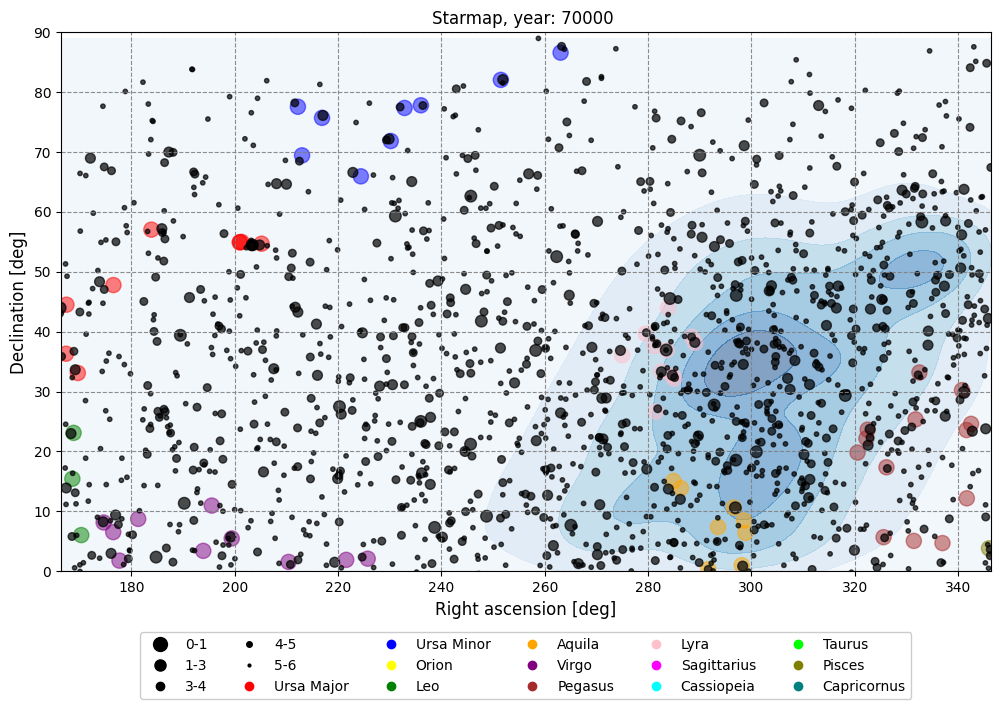

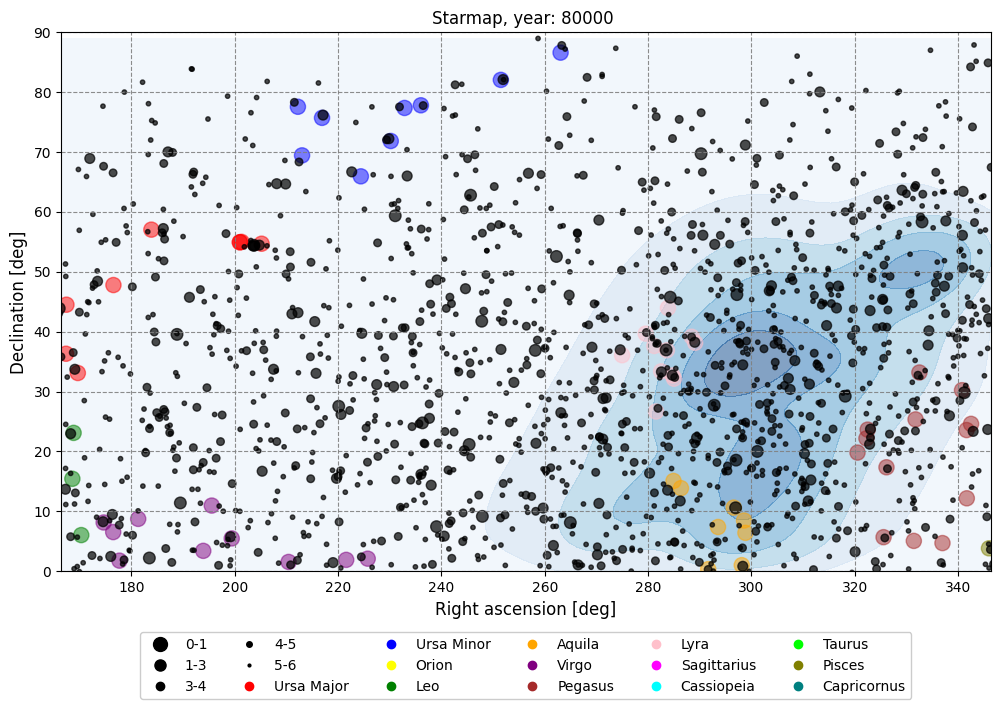

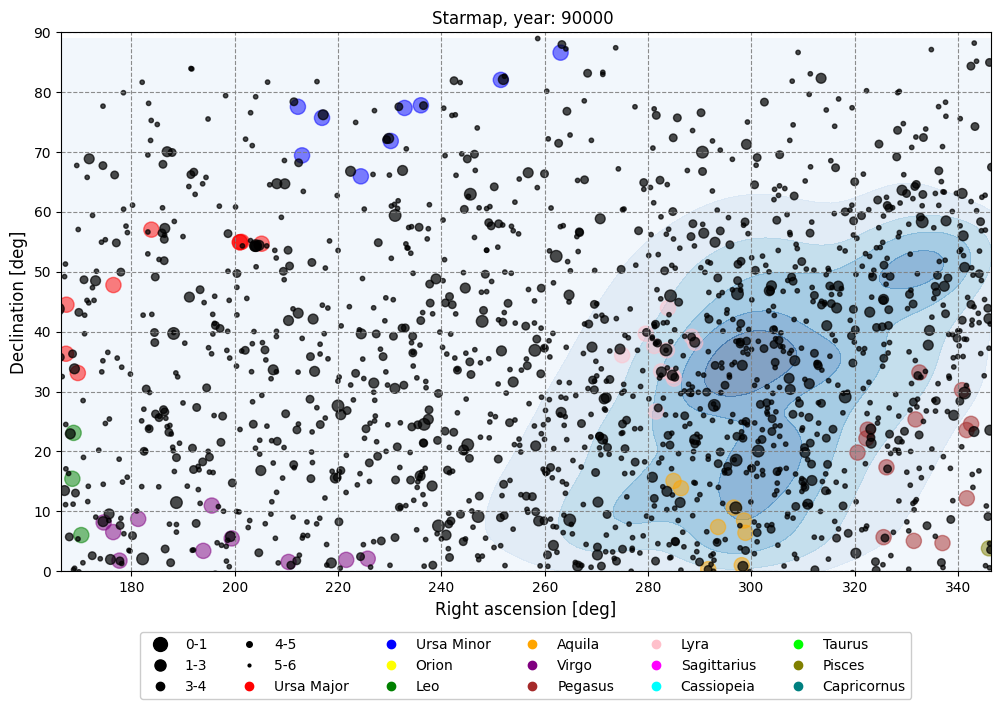

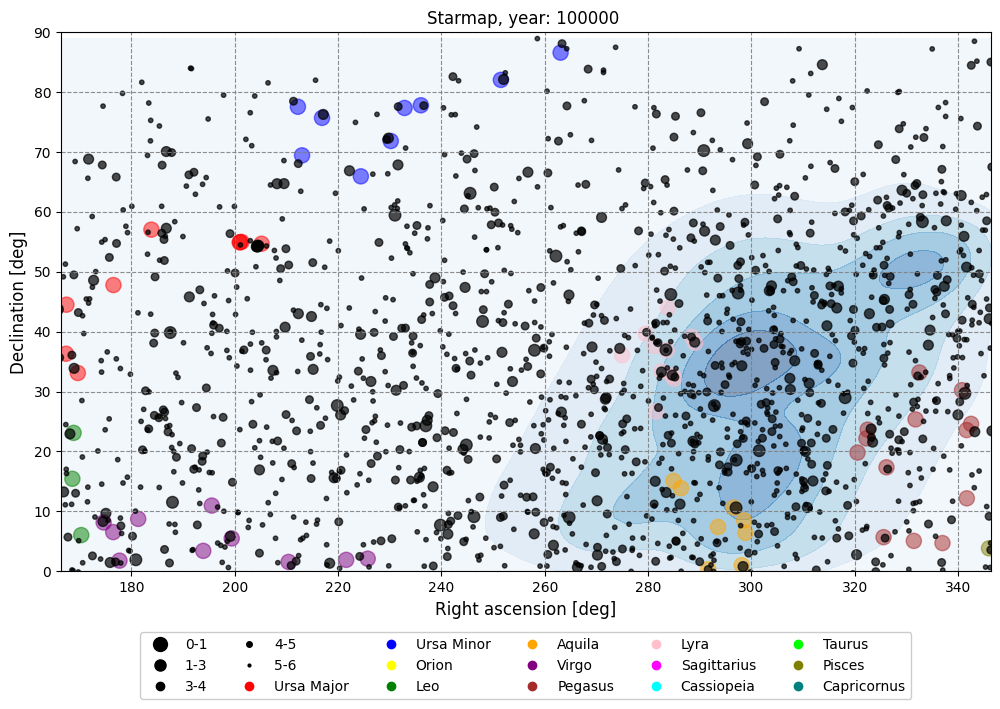

In [13]:
#We have two star arrays: far away stars and close ones
#The idea is to calculate the position of both. We plot the closest ones directly and the far away ones will be represented in the density map

#The proper movement are in mas/yr

#ra and dec are in degrees, hence we have to transform the pmra and pmdec from mas/yr to degrees

time_interval=10000*u.yr

#First we are going to separate it taking magnitudes into account.

mask8=gaia_data_cleaned['phot_g_mean_mag']>=6
gaia_data_cleaned8=gaia_data_cleaned[mask8]
ra8=gaia_data_cleaned8['ra']
dec8=gaia_data_cleaned8['dec']

pmra8_deg=gaia_data_cleaned8['pmra']*(1/(1000*3600)) #convert to deg/year
pmdec8_deg=gaia_data_cleaned8['pmdec']*(1/(1000*3600))

mask6=gaia_data_cleaned['phot_g_mean_mag']<=6
gaia_data_cleaned6=gaia_data_cleaned[mask6]
ra6=gaia_data_cleaned6['ra']
dec6=gaia_data_cleaned6['dec']

pmra6_deg=gaia_data_cleaned6['pmra']*(1/(1000*3600))
pmdec6_deg=gaia_data_cleaned6['pmdec']*(1/(1000*3600))

#We are going to make the maps, we need to make 10 to get to 100000 in steps of 10000.

#This was previously in the 'for' loop, but we can take it outside of it.
time_now = Time.now()
lst = time_now.sidereal_time('mean', longitude=teide.lon)  #Siderial time in hours.
lst_deg = lst.deg  #convert to degrees
ra_min = lst_deg - 90
ra_max = lst_deg + 90
#In order to not get out of the range 0-360 we adjust them using %.
ra_min = ra_min % 360
ra_max = ra_max % 360

if ra_min < ra_max:
    mask6 = (gaia_data_cleaned6['ra'] >= ra_min) & (gaia_data_cleaned6['ra'] <= ra_max)
else:
    mask6 = (gaia_data_cleaned6['ra'] <= ra_min) & (gaia_data_cleaned6['ra'] >= ra_max)
if ra_min < ra_max:
    mask8 = (gaia_data_cleaned8['ra'] >= ra_min) & (gaia_data_cleaned8['ra'] <= ra_max)
else:
    mask8 = (gaia_data_cleaned8['ra'] <= ra_min) & (gaia_data_cleaned8['ra'] >= ra_max)


for i in range(1,11):
  #When multiplying we obtain the ra and dec of this year.
  print(i)
  ra8_new=pmra8_deg*time_interval*i+ra8
  dec8_new=pmdec8_deg*time_interval*i+dec8
  ra6_new=pmra6_deg*time_interval*i+ra6
  dec6_new=pmdec6_deg*time_interval*i+dec6
  #Now we filter the data from gaia.
  ra6Tnf = ra6_new[mask6] #takes stars with apparent magnitude lower than 6
  dec6Tnf = dec6_new[mask6]
  ra8Tnf = ra8_new[mask8] #takes stars with apparent magnitude over 6
  dec8Tnf = dec8_new[mask8]
  gaia_data_cleaned8_new=gaia_data_cleaned8[mask8]
  gaia_data_cleaned6_new=gaia_data_cleaned6[mask6]
  dist_Tnf = coord.Distance(parallax=u.Quantity(gaia_data_cleaned8_new['parallax']),allow_negative=False)
  nanMask_gaia = (np.isnan(dist_Tnf))
  dist_Tnf = dist_Tnf[~nanMask_gaia]
  maskTnf=(dist_Tnf>=1000*u.pc)
  gaia_data_lejos=gaia_data_cleaned8_new[maskTnf]
  star_sizes=[mag_size(mag) for mag in gaia_data_cleaned6_new['phot_g_mean_mag']]
  #create a grid of RA and Dec values.
  ra_grid, dec_grid = np.meshgrid(np.linspace(gaia_data_lejos['ra'].min(), gaia_data_lejos['ra'].max(), 100),
                                 np.linspace(gaia_data_lejos['dec'].min(), gaia_data_lejos['dec'].max(), 100))
  #evaluate the density on the grid.
  kde = gaussian_kde(np.vstack([gaia_data_lejos['ra'], gaia_data_lejos['dec']]))
  positions = np.vstack([ra_grid.ravel(), dec_grid.ravel()])
  density_grid = kde(positions).reshape(ra_grid.shape)
  ra_constelacion = []
  dec_constelacion = []
  star_colors = []
  mask=gaia_data_cleaned6_new['phot_g_mean_mag']<=4.5
  gaia_data_cleaned4=gaia_data_cleaned6_new[mask]
  # Filter out None values (stars not in the constellation list).
  star_colors = [c for c in [constellation_color(star) for star in gaia_data_cleaned4] if c is not None]
  # Plot the contour using the density grid.
  plt.figure(i)

  plt.figure(figsize=(12, 7))
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)
  plt.scatter(ra_constelacion, dec_constelacion, s=120, c=star_colors ,alpha=0.5)
  plt.scatter(ra6Tnf, dec6Tnf, s=star_sizes, c="black" ,alpha=0.7,edgecolors='black')
  plt.title(f"Starmap, year: {(i*10000)} ")
  plt.grid(color='gray', linestyle='--', linewidth=0.8, alpha=0.9)
  plt.ylim(0,90)
  plt.xlim(np.min(ra_grid),np.max(ra_grid))
  plt.xlabel("Right ascension [deg]", fontsize=12)
  plt.ylabel("Declination [deg]", fontsize=12)
  legend_elements=[
      Line2D([0], [0], marker='o', color='black', label='0-1', markersize=10, markerfacecolor='black', linestyle='None'),
      Line2D([0], [0], marker='o', color='black', label='1-3', markersize=8, markerfacecolor='black', linestyle='None'),
      Line2D([0], [0], marker='o', color='black', label='3-4', markersize=6, markerfacecolor='black', linestyle='None'),
      Line2D([0], [0], marker='o', color='black', label='4-5', markersize=4, markerfacecolor='black', linestyle='None'),
      Line2D([0], [0], marker='o', color='black', label='5-6 ', markersize=2, markerfacecolor='black', linestyle='None'),
      Line2D([0], [0], marker='o', color='red', label='Ursa Major', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='blue', label='Ursa Minor', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='yellow', label='Orion', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='green', label='Leo', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='orange', label='Aquila', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='purple', label='Virgo', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='brown', label='Pegasus', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='pink', label='Lyra', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='magenta', label='Sagittarius', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='cyan', label='Cassiopeia', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='lime', label='Taurus', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='olive', label='Pisces', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='teal', label='Capricornus', markersize=6, linestyle='None'),
  ]
  plt.legend(handles=legend_elements, loc='lower center', fontsize=10, framealpha=1, bbox_to_anchor=(0.5,-0.25), ncol=6)

## We can also make a time regression

1


/tmp/ipython-input-3377970901.py:76: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


2


/tmp/ipython-input-3377970901.py:76: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


3


/tmp/ipython-input-3377970901.py:76: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


4


/tmp/ipython-input-3377970901.py:76: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


5


/tmp/ipython-input-3377970901.py:76: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


6


/tmp/ipython-input-3377970901.py:76: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


7


/tmp/ipython-input-3377970901.py:76: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


8


/tmp/ipython-input-3377970901.py:76: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


9


/tmp/ipython-input-3377970901.py:76: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


10


/tmp/ipython-input-3377970901.py:76: UserWarning: linewidths is ignored by contourf
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)


<Figure size 640x480 with 0 Axes>

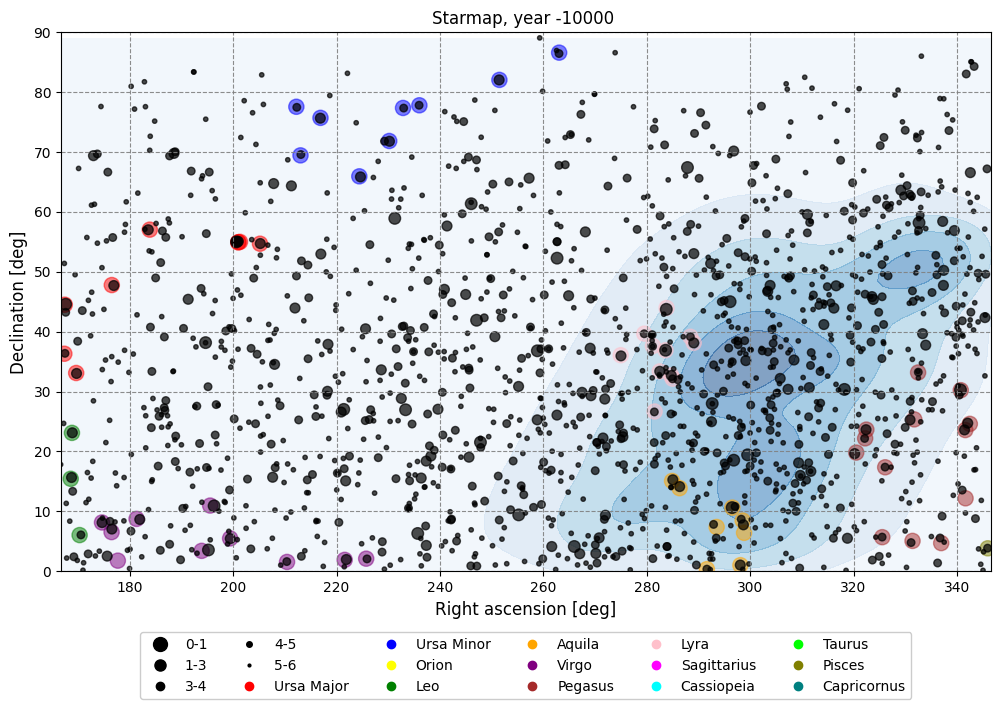

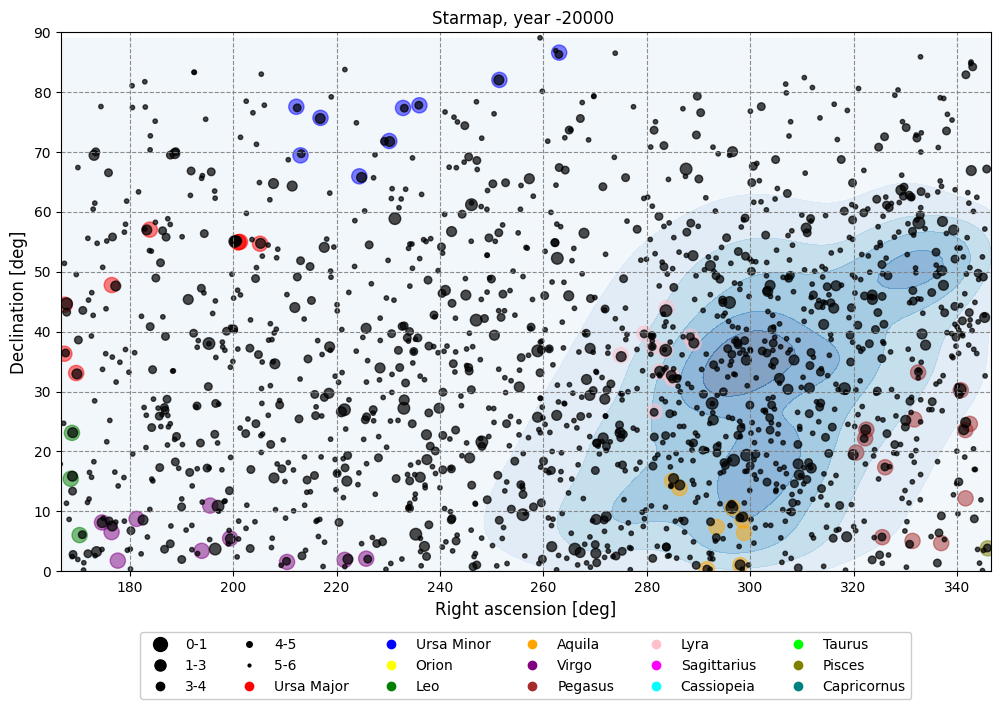

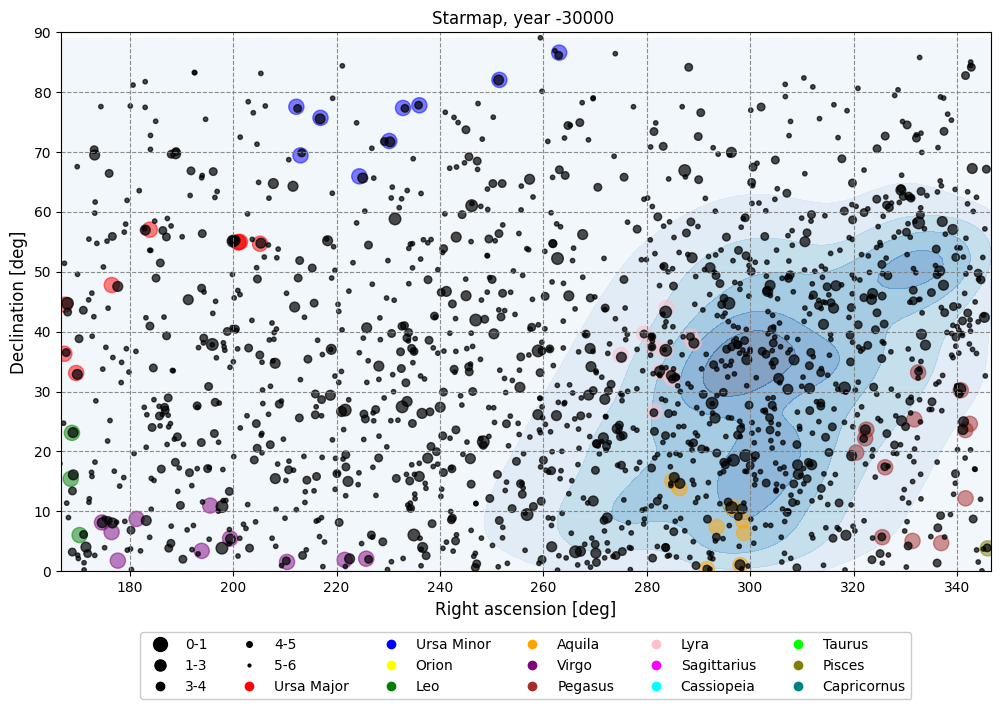

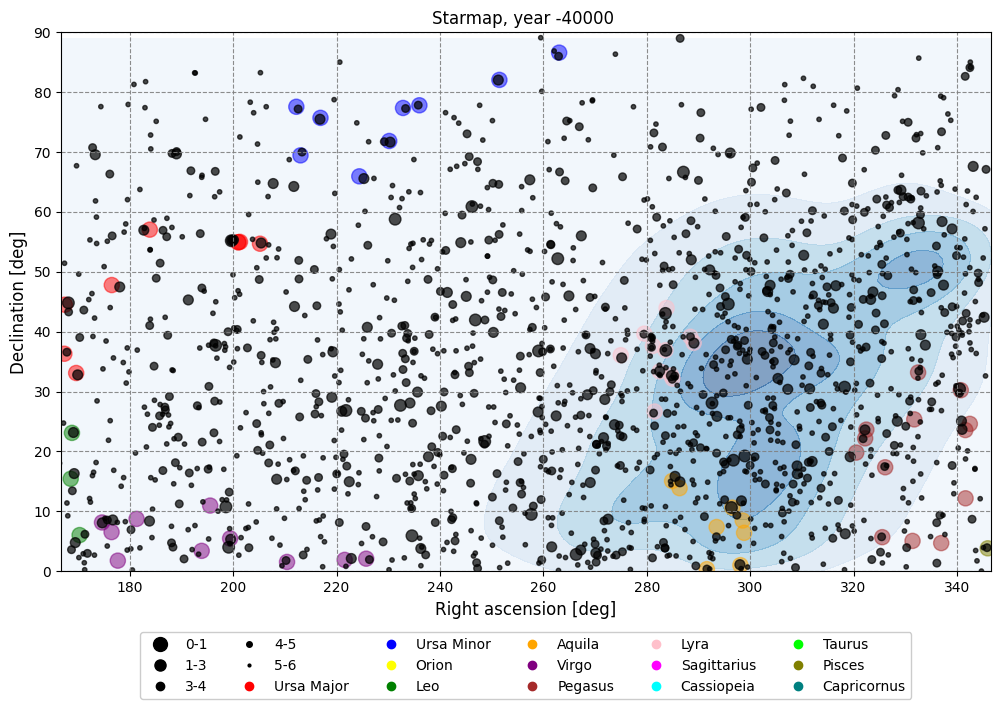

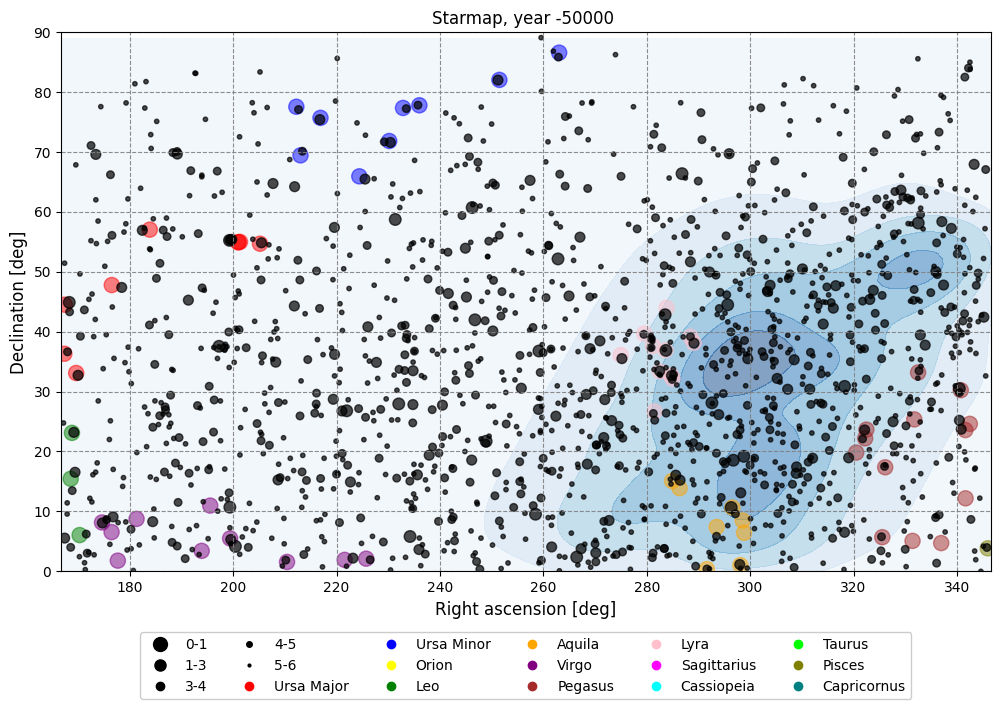

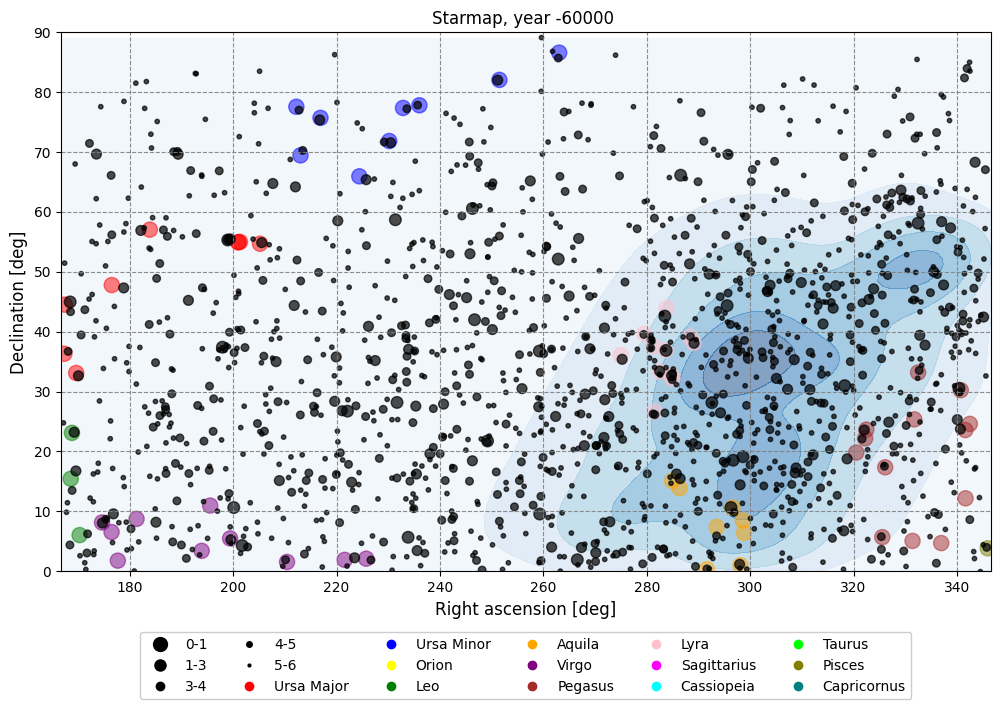

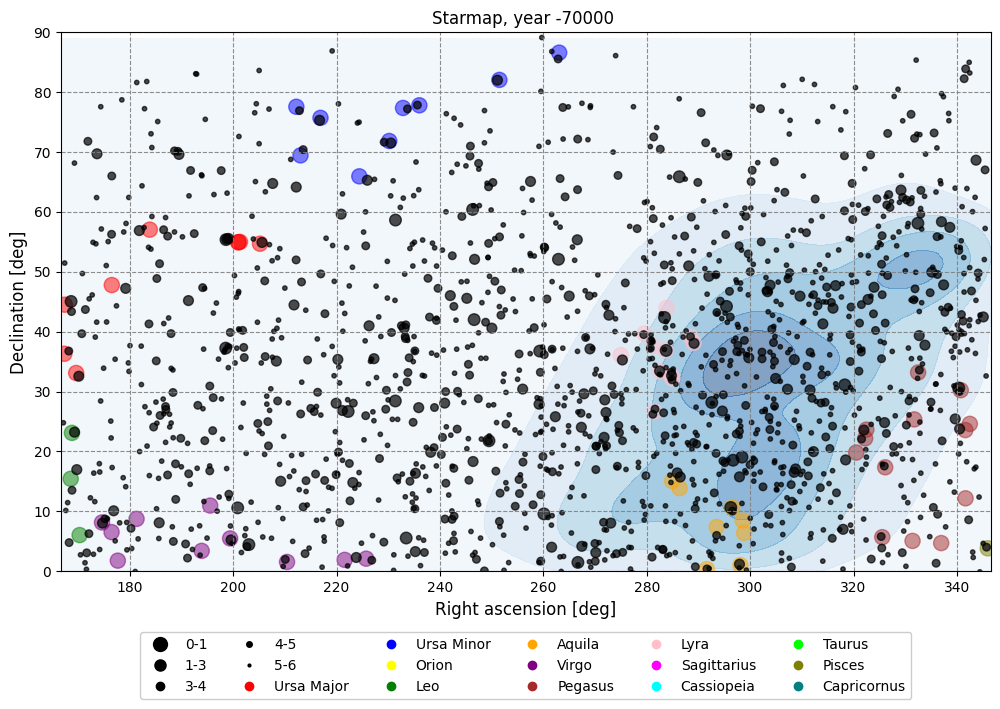

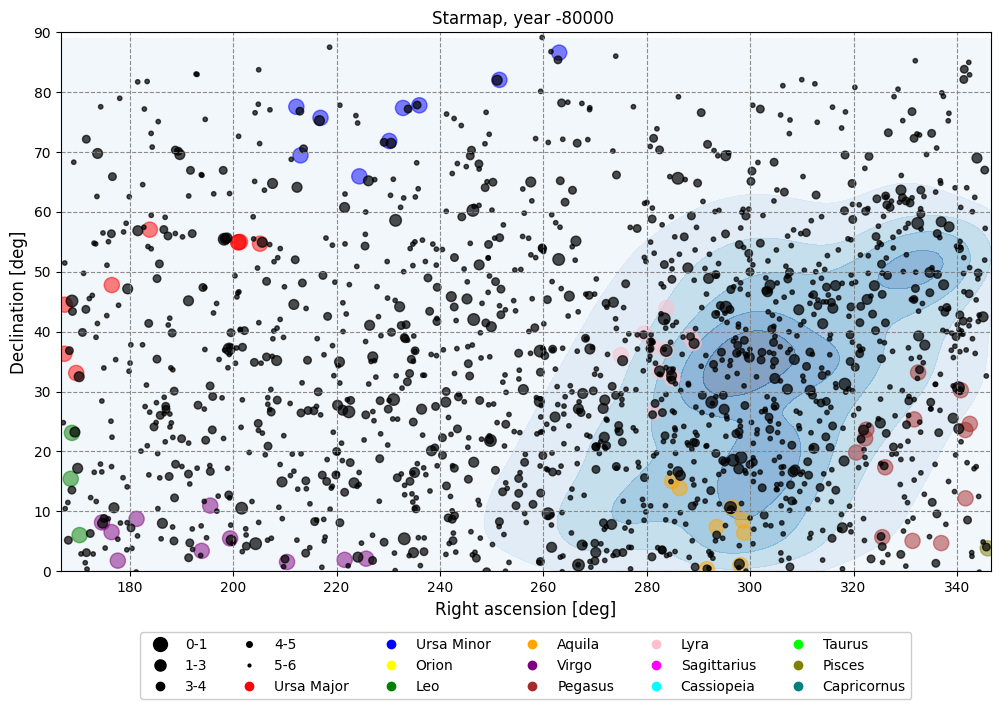

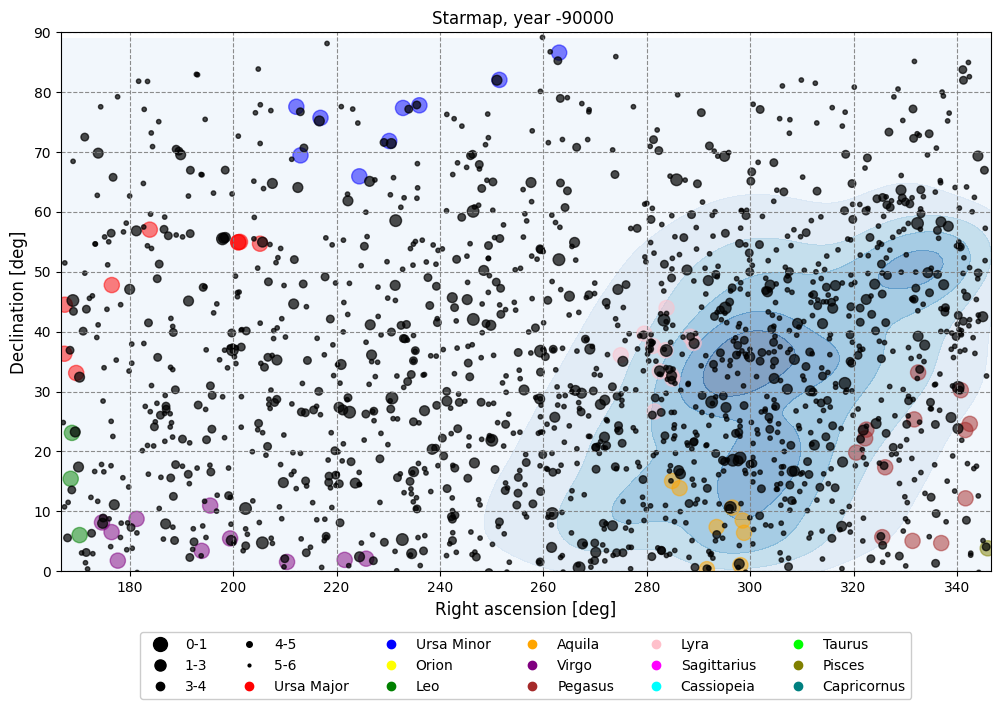

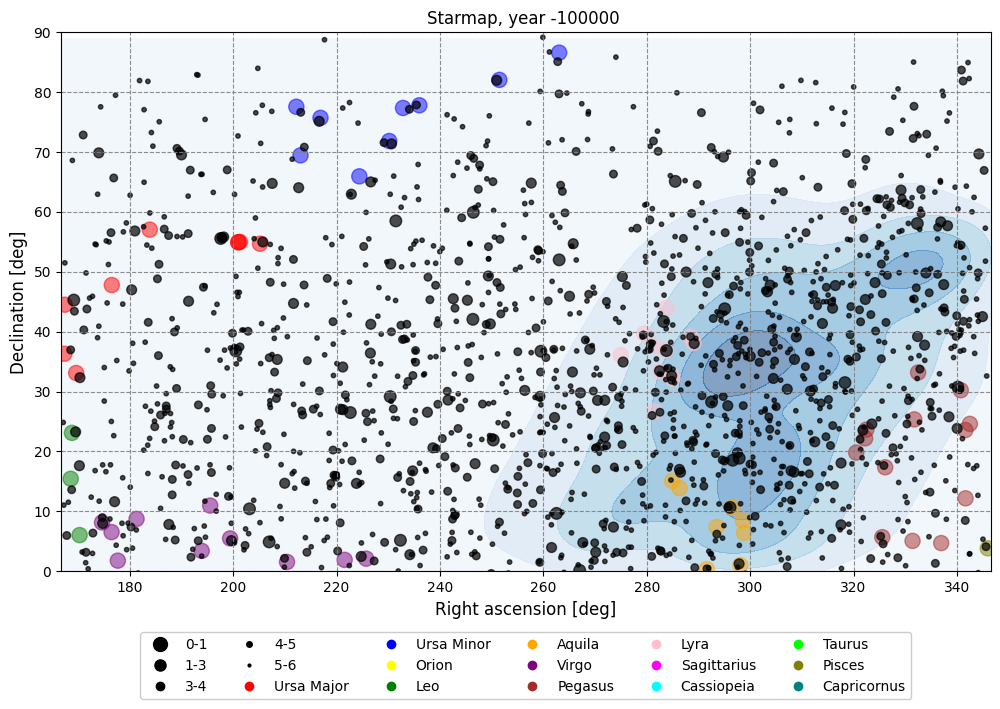

In [14]:

time_interval=10000*u.yr



mask8=gaia_data_cleaned['phot_g_mean_mag']>=6
gaia_data_cleaned8=gaia_data_cleaned[mask8]
ra8=gaia_data_cleaned8['ra']
dec8=gaia_data_cleaned8['dec']

pmra8_deg=gaia_data_cleaned8['pmra']*(1/(1000*3600))
pmdec8_deg=gaia_data_cleaned8['pmdec']*(1/(1000*3600))

mask6=gaia_data_cleaned['phot_g_mean_mag']<=6
gaia_data_cleaned6=gaia_data_cleaned[mask6]
ra6=gaia_data_cleaned6['ra']
dec6=gaia_data_cleaned6['dec']

pmra6_deg=gaia_data_cleaned6['pmra']*(1/(1000*3600))
pmdec6_deg=gaia_data_cleaned6['pmdec']*(1/(1000*3600))


time_now = Time.now()
lst = time_now.sidereal_time('mean', longitude=teide.lon)
lst_deg = lst.deg
ra_min = lst_deg - 90
ra_max = lst_deg + 90
ra_min = ra_min % 360
ra_max = ra_max % 360

if ra_min < ra_max:
    mask6 = (gaia_data_cleaned6['ra'] >= ra_min) & (gaia_data_cleaned6['ra'] <= ra_max)
else:
    mask6 = (gaia_data_cleaned6['ra'] <= ra_min) & (gaia_data_cleaned6['ra'] >= ra_max)
if ra_min < ra_max:
    mask8 = (gaia_data_cleaned8['ra'] >= ra_min) & (gaia_data_cleaned8['ra'] <= ra_max)
else:
    mask8 = (gaia_data_cleaned8['ra'] <= ra_min) & (gaia_data_cleaned8['ra'] >= ra_max)


for i in range(1,11):
  print(i)
  ra8_new=-pmra8_deg*time_interval*i+ra8
  dec8_new=-pmdec8_deg*time_interval*i+dec8
  ra6_new=-pmra6_deg*time_interval*i+ra6
  dec6_new=-pmdec6_deg*time_interval*i+dec6
  ra6Tnf = ra6_new[mask6]
  dec6Tnf = dec6_new[mask6]
  ra8Tnf = ra8_new[mask8]
  dec8Tnf = dec8_new[mask8]
  gaia_data_cleaned8_new=gaia_data_cleaned8[mask8]
  gaia_data_cleaned6_new=gaia_data_cleaned6[mask6]
  dist_Tnf = coord.Distance(parallax=u.Quantity(gaia_data_cleaned8_new['parallax']),allow_negative=False)
  nanMask_gaia = (np.isnan(dist_Tnf))
  dist_Tnf = dist_Tnf[~nanMask_gaia]
  maskTnf=(dist_Tnf>=1000*u.pc)
  gaia_data_lejos=gaia_data_cleaned8_new[maskTnf]
  star_sizes=[mag_size(mag) for mag in gaia_data_cleaned6_new['phot_g_mean_mag']]
  #Create a grid of RA and Dec values.
  ra_grid, dec_grid = np.meshgrid(np.linspace(gaia_data_lejos['ra'].min(), gaia_data_lejos['ra'].max(), 100),
                                 np.linspace(gaia_data_lejos['dec'].min(), gaia_data_lejos['dec'].max(), 100))
  #evaluate the density on the grid.
  kde = gaussian_kde(np.vstack([gaia_data_lejos['ra'], gaia_data_lejos['dec']]))
  positions = np.vstack([ra_grid.ravel(), dec_grid.ravel()])
  density_grid = kde(positions).reshape(ra_grid.shape)
  ra_constelacion = []
  dec_constelacion = []
  star_colors = []
  mask=gaia_data_cleaned6_new['phot_g_mean_mag']<=4.5
  gaia_data_cleaned4=gaia_data_cleaned6_new[mask]
  #Filter out None values (stars not in the constellation list).
  star_colors = [c for c in [constellation_color(star) for star in gaia_data_cleaned4] if c is not None]
  #plot the contour using the density grid.
  plt.figure(i)

  plt.figure(figsize=(12, 7))
  contour = plt.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)
  plt.scatter(ra_constelacion, dec_constelacion, s=120, c=star_colors ,alpha=0.5)
  plt.scatter(ra6Tnf, dec6Tnf, s=star_sizes, c="black" ,alpha=0.7,edgecolors='black')
  plt.title(f"Starmap, year {-(i*10000)} ")
  plt.grid(color='gray', linestyle='--', linewidth=0.8, alpha=0.9)
  plt.ylim(0,90)
  plt.xlim(np.min(ra_grid),np.max(ra_grid))
  plt.xlabel("Right ascension [deg]", fontsize=12)
  plt.ylabel("Declination [deg]", fontsize=12)
  legend_elements=[
      Line2D([0], [0], marker='o', color='black', label='0-1', markersize=10, markerfacecolor='black', linestyle='None'),
      Line2D([0], [0], marker='o', color='black', label='1-3', markersize=8, markerfacecolor='black', linestyle='None'),
      Line2D([0], [0], marker='o', color='black', label='3-4', markersize=6, markerfacecolor='black', linestyle='None'),
      Line2D([0], [0], marker='o', color='black', label='4-5', markersize=4, markerfacecolor='black', linestyle='None'),
      Line2D([0], [0], marker='o', color='black', label='5-6 ', markersize=2, markerfacecolor='black', linestyle='None'),
      Line2D([0], [0], marker='o', color='red', label='Ursa Major', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='blue', label='Ursa Minor', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='yellow', label='Orion', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='green', label='Leo', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='orange', label='Aquila', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='purple', label='Virgo', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='brown', label='Pegasus', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='pink', label='Lyra', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='magenta', label='Sagittarius', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='cyan', label='Cassiopeia', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='lime', label='Taurus', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='olive', label='Pisces', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='teal', label='Capricornus', markersize=6, linestyle='None'),
  ]
  plt.legend(handles=legend_elements, loc='lower center', fontsize=10, framealpha=1, bbox_to_anchor=(0.5,-0.25), ncol=6)

## Finally, let's animate the time evolution of star's proper movements.

/tmp/ipython-input-939568148.py:86: UserWarning: linewidths is ignored by contourf
  contour = ax.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)
/tmp/ipython-input-939568148.py:86: UserWarning: linewidths is ignored by contourf
  contour = ax.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)
/tmp/ipython-input-939568148.py:86: UserWarning: linewidths is ignored by contourf
  contour = ax.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)
/tmp/ipython-input-939568148.py:86: UserWarning: linewidths is ignored by contourf
  contour = ax.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)
/tmp/ipython-input-939568148.py:86: UserWarning: linewidths is ignored by contourf
  contour = ax.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)
/tmp/ipython-input-939568148.py:86: UserWarni

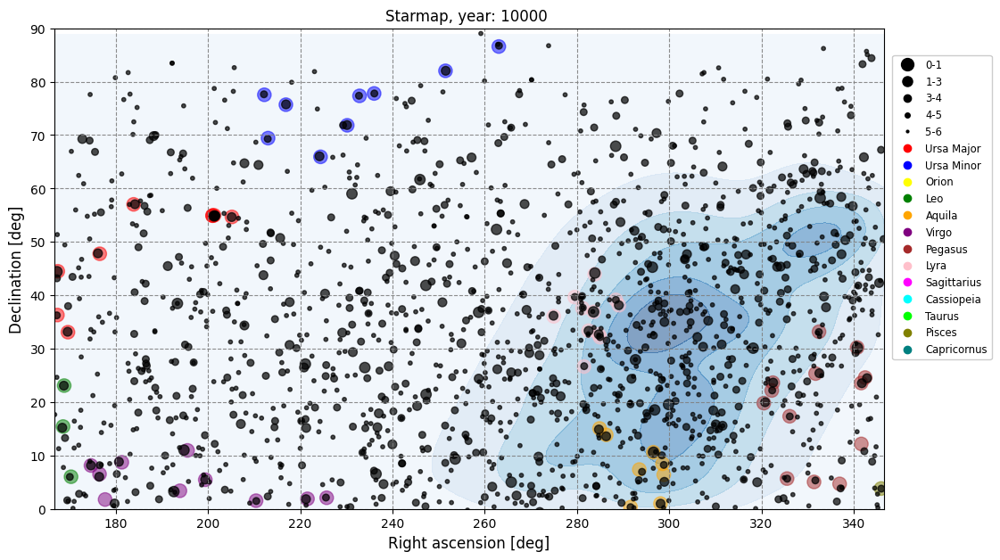

In [15]:
from matplotlib.animation import FuncAnimation

#we must initializethe figure and axes outside the loop.
fig, ax = plt.subplots(figsize=(12,7))

ax.grid()
#ax.set_title("Animation of star's proper movements")  #tiulo fijo

def animate(i):
    for artist in ax.collections + ax.lines + ax.texts:  #clear previous frame's things
      #if artist is not title_text:
      artist.remove()


    ra8_new=pmra8_deg*time_interval*i+ra8
    dec8_new=pmdec8_deg*time_interval*i+dec8
    ra6_new=pmra6_deg*time_interval*i+ra6
    dec6_new=pmdec6_deg*time_interval*i+dec6
    #Now we filter gaia data
    ra6Tnf = ra6_new[mask6]
    dec6Tnf = dec6_new[mask6]
    ra8Tnf = ra8_new[mask8]
    dec8Tnf = dec8_new[mask8]
    gaia_data_cleaned8_new=gaia_data_cleaned8[mask8]
    gaia_data_cleaned6_new=gaia_data_cleaned6[mask6]
    dist_Tnf = coord.Distance(parallax=u.Quantity(gaia_data_cleaned8_new['parallax']),allow_negative=False)
    nanMask_gaia = (np.isnan(dist_Tnf))
    dist_Tnf = dist_Tnf[~nanMask_gaia]
    maskTnf=(dist_Tnf>=1000*u.pc)
    gaia_data_lejos=gaia_data_cleaned8_new[maskTnf]
    star_sizes=[mag_size(mag) for mag in gaia_data_cleaned6_new['phot_g_mean_mag']]

    ra_grid, dec_grid = np.meshgrid(np.linspace(gaia_data_lejos['ra'].min(), gaia_data_lejos['ra'].max(), 100),
                                  np.linspace(gaia_data_lejos['dec'].min(), gaia_data_lejos['dec'].max(), 100))

    kde = gaussian_kde(np.vstack([gaia_data_lejos['ra'], gaia_data_lejos['dec']]))
    positions = np.vstack([ra_grid.ravel(), dec_grid.ravel()])
    density_grid = kde(positions).reshape(ra_grid.shape)

    def constellation_color(star):
      constelaciones = ['Ursa Major', 'Ursa Minor', 'Orion', 'Leo', 'Aquila', 'Virgo', 'Pegasus', 'Lyra', 'Sagittarius', 'Cassiopeia', 'Taurus', 'Pisces', 'Capricornus']
      ra = star['ra']
      dec = star['dec']
      coord = SkyCoord(ra=ra*u.degree, dec=dec*u.degree, frame='icrs') #extracts the star's coordinates.
      constellation = coord.get_constellation()
      if constellation in constelaciones:
          ra_constelacion.append(ra) #if the constellation is in our constelaciones list, we assign a colour to it.
          dec_constelacion.append(dec)
          if constellation == 'Ursa Major':
              return 'red'
          elif constellation == 'Ursa Minor':
              return 'blue'
          elif constellation == 'Orion':
              return 'yellow'
          elif constellation == 'Leo':
              return 'green'
          elif constellation == 'Aquila':
              return 'orange'
          elif constellation == 'Virgo':
              return 'purple'
          elif constellation == 'Pegasus':
              return 'brown'
          elif constellation == 'Lyra':
              return 'pink'
          elif constellation == 'Sagittarius':
              return 'magenta'
          elif constellation == 'Cassiopeia':
              return 'cyan'
          elif constellation == 'Taurus':
              return 'lime'
          elif constellation == 'Pisces':
              return 'olive'
          elif constellation == 'Capricornus':
              return 'teal'
      return None
    ra_constelacion = []
    dec_constelacion = []
    star_colors = []
    mask=gaia_data_cleaned6_new['phot_g_mean_mag']<=4.5
    gaia_data_cleaned4=gaia_data_cleaned6_new[mask]

    star_colors = [c for c in [constellation_color(star) for star in gaia_data_cleaned4] if c is not None]


    #important to plot in the ax (so that we can clear them later).
    contour = ax.contourf(ra_grid, dec_grid, density_grid, levels=5, cmap='Blues', linewidths=1.7, alpha=0.5)
    ax.scatter(ra_constelacion, dec_constelacion, s=120, c=star_colors, alpha=0.5) # plot on the axis object.
    ax.scatter(ra6Tnf, dec6Tnf, s=star_sizes, c='black', alpha=0.7,edgecolors='black')
    plt.title(f"Starmap, year: {(i*10000)} ")
    plt.grid(color='gray', linestyle='--', linewidth=0.8, alpha=0.9)
    plt.ylim(0,90)
    plt.xlim(np.min(ra_grid),np.max(ra_grid))
    plt.xlabel("Right ascension [deg]", fontsize=12)
    plt.ylabel("Declination [deg]", fontsize=12)
    legend_elements=[
      Line2D([0], [0], marker='o', color='black', label='0-1', markersize=10, markerfacecolor='black', linestyle='None'),
      Line2D([0], [0], marker='o', color='black', label='1-3', markersize=8, markerfacecolor='black', linestyle='None'),
      Line2D([0], [0], marker='o', color='black', label='3-4', markersize=6, markerfacecolor='black', linestyle='None'),
      Line2D([0], [0], marker='o', color='black', label='4-5', markersize=4, markerfacecolor='black', linestyle='None'),
      Line2D([0], [0], marker='o', color='black', label='5-6 ', markersize=2, markerfacecolor='black', linestyle='None'),
      Line2D([0], [0], marker='o', color='red', label='Ursa Major', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='blue', label='Ursa Minor', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='yellow', label='Orion', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='green', label='Leo', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='orange', label='Aquila', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='purple', label='Virgo', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='brown', label='Pegasus', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='pink', label='Lyra', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='magenta', label='Sagittarius', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='cyan', label='Cassiopeia', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='lime', label='Taurus', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='olive', label='Pisces', markersize=6, linestyle='None'),
      Line2D([0], [0], marker='o', color='teal', label='Capricornus', markersize=6, linestyle='None'),
    ]
    plt.legend(handles=legend_elements, loc='lower center', fontsize='small', framealpha=1, bbox_to_anchor=(1.07,0.3), ncol=1)
    return contour


ani = FuncAnimation(fig, animate, frames=range(1, 11), interval=200, blit=False) # interval in ms between frames
#saves the animation the animation as a gif (using pillow library), though i'd rather have it as a .mp4
ani.save('star_animation.gif', writer='pillow')
#The animation is save in the archives part of google colab
